In [258]:
import numpy as np
import pandas as pd
np.set_printoptions(threshold=np.inf)

# Kernel Density Estimation

## 2.2 Task-1

In [259]:
import numpy as np
import matplotlib.pyplot as plt

class KernelDensityEstimation:
    def __init__(self, kernel='gaussian',bandwidth=None):
        self.kernel = kernel
        self.bandwidth=bandwidth

    def fit(self, data):
        self.data = np.asarray(data)
        if self.bandwidth is None:
            self.bandwidth = self.select_bandwidth()

    def select_bandwidth(self):
        n = len(self.data)
        log_likelihoods = []
        for bw in np.linspace(0.1, 1.0, 30):
            log_likelihoods.append(np.sum(np.log(self.kernel_density(self.data, bw) + 1e-10)))
        return np.linspace(0.1, 1.0, 30)[np.argmax(log_likelihoods)]
    
    def kernel_density(self, x, bandwidth):
        # Referred ChatGPT
        if(self.kernel=='gaussian'):
            if self.data.ndim == 1:
                return np.exp(-0.5 * ((x - self.data[:, np.newaxis]) / bandwidth) ** 2) / (np.sqrt(2 * np.pi) * bandwidth)
            else:
                x_diff = x - self.data[:, np.newaxis]
                return np.exp(-0.5 * (np.linalg.norm(x_diff, axis=-1) / bandwidth) ** 2) / ((2 * np.pi) ** (self.data.shape[1] / 2) * bandwidth ** self.data.shape[1])
        elif self.kernel == 'box':
            if self.data.ndim == 1:
                return np.where(np.abs(x - self.data[:, np.newaxis]) <= bandwidth / 2, 1 / bandwidth, 0)
            else:
                x_diff = np.abs(x - self.data[:, np.newaxis])
                return np.prod(np.where(x_diff <= bandwidth / 2, 1 / bandwidth, 0), axis=-1)
        elif self.kernel == 'triangular':
            if self.data.ndim == 1:
                return np.maximum(0, 1 - np.abs((x - self.data[:, np.newaxis]) / bandwidth))
            else:
                x_diff = np.abs(x - self.data[:, np.newaxis]) / bandwidth
                return np.prod(np.maximum(0, 1 - x_diff), axis=-1)
            
    def evaluate_density(self, x):
        x = np.asarray(x)
        return np.mean(self.kernel_density(x, self.bandwidth), axis=0)

    def visualize(self):
        # Referred ChatGPT
        if self.data.ndim == 1:
            self.visualize_1d()
        elif self.data.ndim == 2:
            self.visualize_2d()
        else:
            print("Visualization is supported only for 1-D and 2-D data.")

    def visualize_1d(self):
        x_range = np.linspace(self.data.min(), self.data.max(), 1000)
        kde_values = self.evaluate_density(x_range)

        plt.plot(x_range, kde_values, label=f'KDE ({self.kernel} kernel)')
        plt.hist(self.data, density=True, alpha=0.5, label='Data Histogram')
        plt.title('Kernel Density Estimation (1D)')
        plt.xlabel('Data')
        plt.ylabel('Density')
        plt.legend()
        plt.show()

    def visualize_2d(self):
        x_min, x_max = self.data[:, 0].min(), self.data[:, 0].max()
        y_min, y_max = self.data[:, 1].min(), self.data[:, 1].max()

        xx, yy = np.meshgrid(np.linspace(x_min, x_max, 100), np.linspace(y_min, y_max, 100))
        grid_points = np.c_[xx.ravel(), yy.ravel()]

        kde_values = self.evaluate_density(grid_points)
        kde_values = kde_values.reshape(xx.shape)

        plt.contourf(xx, yy, kde_values, cmap='viridis', levels=20)
        plt.scatter(self.data[:, 0], self.data[:, 1], alpha=0.5, color='blue', label='Data Points')
        plt.title('Kernel Density Estimation (2D)')
        plt.xlabel('Feature 1')
        plt.ylabel('Feature 2')
        plt.colorbar(label='Density')
        plt.legend()
        plt.show()

### Sample Visualization of random 1d and 2d data

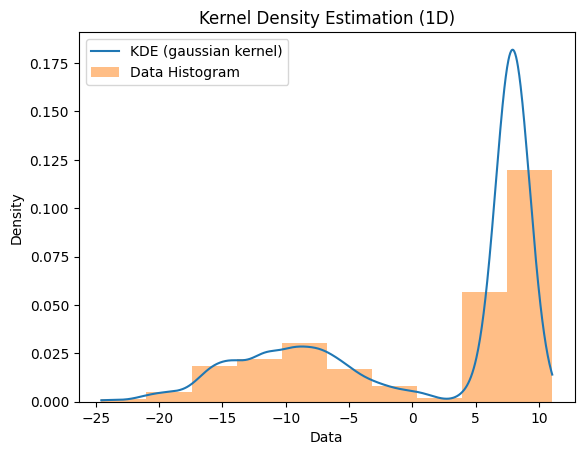

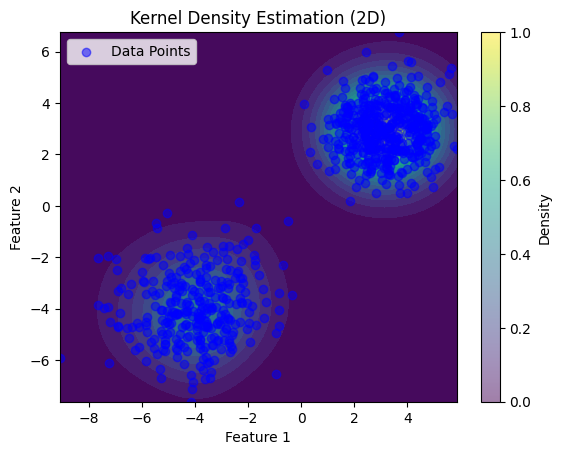

In [260]:
kde = KernelDensityEstimation(kernel='gaussian')

data_1d = np.concatenate([np.random.normal(-10, 5, 300), np.random.normal(8, 1, 500)])

kde.fit(data_1d)
kde.visualize()

data_2d = np.concatenate([np.random.multivariate_normal([-4, -4], [[2, 0], [0, 2]], 300),
                          np.random.multivariate_normal([3, 3], [[1, 0], [0, 1]], 500)])
kde.fit(data_2d)
kde.visualize()

## 2.3 Task-2

In [261]:
import cv2
from sklearn.impute import SimpleImputer

### Using the KDE implemented in the previous task, estimating the appropriate horizontal and vertical thresholds to apply to the distances between the boxes, such that boxes within the same paragraphs are connected and there are no connections to boxes in other paragraphs.

In [262]:
def make_connections(image, euclidean):

  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  image_with_boxes = image_rgb.copy()

  for index, row in euclidean.iterrows():
      left = int(row['Left'][0])
      right = int(row['Right'][0])
      top = int(row['Top'][1])
      bottom = int(row['Bottom'][1])
      box_id = int(row['Id'])

      width = right - left
      height = bottom - top

      top_left = (left, top)
      bottom_right = (right, bottom)
      cv2.rectangle(image_with_boxes, top_left, bottom_right, (255, 0, 0), 2)

      label_position = (left, top - 10)
      cv2.putText(image_with_boxes, str(box_id), label_position, cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 255), 1)

      top_adjacent_id = int(row['Top Box'][1])
      bottom_adjacent_id = int(row['Bottom Box'][1])
      left_adjacent_id = int(row['Left Box'][1])
      right_adjacent_id = int(row['Right Box'][1])

      if top_adjacent_id != 0:
          top_adjacent_row = euclidean[euclidean['Id'] == top_adjacent_id].iloc[0]
          top_adjacent_center = int(top_adjacent_row['Bottom'][0]) , int(top_adjacent_row['Bottom'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(top)), top_adjacent_center, (0, 255, 0), 2)

      if bottom_adjacent_id != 0:
          bottom_adjacent_row = euclidean[euclidean['Id'] == bottom_adjacent_id].iloc[0]
          bottom_adjacent_center = int(bottom_adjacent_row['Top'][0]) , int(bottom_adjacent_row['Top'][1])
          cv2.line(image_with_boxes, (int(left) + width // 2, int(bottom)), (int(bottom_adjacent_center[0]), int(bottom_adjacent_center[1])), (0, 255, 0), 2)

      if left_adjacent_id != 0:
          left_adjacent_row = euclidean[euclidean['Id'] == left_adjacent_id].iloc[0]
          left_adjacent_center = int(left_adjacent_row['Right'][0]) , int(left_adjacent_row['Right'][1])
          cv2.line(image_with_boxes, (int(left), int(top) + height // 2), (int(left_adjacent_center[0]), int(left_adjacent_center[1])), (0, 255, 0), 2)

      if right_adjacent_id != 0:
          right_adjacent_row = euclidean[euclidean['Id'] == right_adjacent_id].iloc[0]
          right_adjacent_center = int(right_adjacent_row['Left'][0]) , int(right_adjacent_row['Left'][1])
          cv2.line(image_with_boxes, (int(right), int(top) + height // 2), (int(right_adjacent_center[0]), int(right_adjacent_center[1])), (0, 255, 0), 2)

  return image_with_boxes

In [263]:
def visualize_bboxes(image_id=29, kernel="gaussian", bandwidth=None):
    data = pd.read_csv("SMAI - AQ2/CSV/TLBR_"+str(image_id)+".csv")

    # Referred ChatGPT and Google for this function

    for i in range(len(data)):
        top_left = (int(data['Top-Left'][i].split(',')[0][1:]),
                    int(data['Top-Left'][i].split(',')[1][:-1]))
        bottom_right = (int(data['Bottom-Right'][i].split(',')[0][1:]),
                        int(data['Bottom-Right'][i].split(',')[1][:-1]))
        data.at[i, "Top"] = "[" + \
            str((top_left[0]+(bottom_right[0]-top_left[0])/2)) + \
            ", "+str((top_left[1]))+"]"
        data.at[i, "Bottom"] = "[" + \
            str((top_left[0]+(bottom_right[0]-top_left[0])/2)) + \
            ", "+str(((bottom_right[1])))+"]"
        data.at[i, "Left"] = "["+str((top_left[0]))+", " + \
            str((top_left[1]+(bottom_right[1]-top_left[1])/2))+"]"
        data.at[i, "Right"] = "["+str((bottom_right[0]))+", " + \
            str((top_left[1]+(bottom_right[1]-top_left[1])/2))+"]"
        data.at[i, "Top Box"] = "nan"
        data.at[i, "Bottom Box"] = "nan"
        data.at[i, "Right Box"] = "nan"
        data.at[i, "Left Box"] = "nan"
        data.at[i, "min_top_distance"] = 0
        data.at[i, "min_bottom_distance"] = 0
        data.at[i, "min_left_distance"] = 0
        data.at[i, "min_right_distance"] = 0

    def euclidean_distance(point1, point2):
        return np.sqrt((point1[0] - point2[0]) ** 2 + (point1[1] - point2[1]) ** 2)

    for i, row in data.iterrows():
        top_center = eval(row['Top'])
        bottom_center = eval(row['Bottom'])
        left_center = eval(row['Left'])
        right_center = eval(row['Right'])

        nearest_top = None
        nearest_bottom = None
        nearest_left = None
        nearest_right = None
        min_top_distance = 10000
        min_bottom_distance = 10000
        min_left_distance = 10000
        min_right_distance = 10000

        for j, other_row in data.iterrows():
            if i == j:
                continue

            other_top_center = eval(other_row['Top'])
            other_bottom_center = eval(other_row['Bottom'])
            other_left_center = eval(other_row['Left'])
            other_right_center = eval(other_row['Right'])

            top_distance = euclidean_distance(top_center, other_bottom_center)
            bottom_distance = euclidean_distance(
                bottom_center, other_top_center)
            left_distance = euclidean_distance(left_center, other_right_center)
            right_distance = euclidean_distance(
                right_center, other_left_center)

            if top_distance < min_top_distance:
                min_top_distance = top_distance
                data['nearest_top'] = other_row['Id']
            if bottom_distance < min_bottom_distance:
                min_bottom_distance = bottom_distance
                data['nearest_bottom'] = other_row['Id']
            if left_distance < min_left_distance:
                min_left_distance = left_distance
                data['nearest_left'] = other_row['Id']
            if right_distance < min_right_distance:
                min_right_distance = right_distance
                data['nearest_right'] = other_row['Id']

        data.at[i, 'min_top_distance'] = min_top_distance
        data.at[i, 'min_bottom_distance'] = min_bottom_distance
        data.at[i, 'min_left_distance'] = min_left_distance
        data.at[i, 'min_right_distance'] = min_right_distance

    def kde_threshold(values):
        imputer = SimpleImputer(strategy='mean')
        values = imputer.fit_transform(values.reshape(-1, 1))
        kde = KernelDensityEstimation(kernel=kernel, bandwidth=bandwidth)
        kde.fit(values)
        kde_values = kde.evaluate_density(values)
        probability_threshold = np.percentile(kde_values, 60)
        distances = values[np.where(kde_values >= probability_threshold)[0]]
        threshold_distance = np.mean(distances)
        return threshold_distance

    threshold_top = kde_threshold(data['min_top_distance'].values)
    threshold_bottom = kde_threshold(data['min_bottom_distance'].values)
    threshold_left = kde_threshold(data['min_left_distance'].values)
    threshold_right = kde_threshold(data['min_right_distance'].values)

    print('Thresholds :-')
    print('Top :', threshold_top)
    print('Bottom :', threshold_bottom)
    print('Left :', threshold_left)
    print('Right :', threshold_right)

    for i, row in data.iterrows():
        top_center = eval(row['Top'])
        bottom_center = eval(row['Bottom'])
        left_center = eval(row['Left'])
        right_center = eval(row['Right'])

        nearest_top = None
        nearest_bottom = None
        nearest_left = None
        nearest_right = None
        min_top_distance = 10000
        min_bottom_distance = 10000
        min_left_distance = 10000
        min_right_distance = 10000

        for j, other_row in data.iterrows():
            if i == j:
                continue

            other_top_center = eval(other_row['Top'])
            other_bottom_center = eval(other_row['Bottom'])
            other_left_center = eval(other_row['Left'])
            other_right_center = eval(other_row['Right'])

            top_distance = euclidean_distance(top_center, other_bottom_center)
            bottom_distance = euclidean_distance(
                bottom_center, other_top_center)
            left_distance = euclidean_distance(left_center, other_right_center)
            right_distance = euclidean_distance(
                right_center, other_left_center)

            if top_distance < min_top_distance:
                min_top_distance = top_distance
                nearest_top = other_row['Id']
            if bottom_distance < min_bottom_distance:
                min_bottom_distance = bottom_distance
                nearest_bottom = other_row['Id']
            if left_distance < min_left_distance:
                min_left_distance = left_distance
                nearest_left = other_row['Id']
            if right_distance < min_right_distance:
                min_right_distance = right_distance
                nearest_right = other_row['Id']

        if (min_top_distance < threshold_top):
            data.at[i, 'Top Box'] = [min_top_distance, nearest_top]
        else:
            data.at[i, 'Top Box'] = [-1, 0]
        if (min_bottom_distance < threshold_bottom):
            data.at[i, 'Bottom Box'] = [min_bottom_distance, nearest_bottom]
        else:
            data.at[i, 'Bottom Box'] = [-1, 0]
        if (min_left_distance < threshold_left):
            data.at[i, 'Left Box'] = [min_left_distance, nearest_left]
        else:
            data.at[i, 'Left Box'] = [-1, 0]
        if (min_right_distance < threshold_right):
            data.at[i, 'Right Box'] = [min_right_distance, nearest_right]
        else:
            data.at[i, 'Right Box'] = [-1, 0]

    for i in range(len(data)):
        top_left = (int(data['Top-Left'][i].split(',')[0][1:]),
                    int(data['Top-Left'][i].split(',')[1][:-1]))
        bottom_right = (int(data['Bottom-Right'][i].split(',')[0][1:]),
                        int(data['Bottom-Right'][i].split(',')[1][:-1]))
        data.at[i, "Top"] = [
            (top_left[0]+(bottom_right[0]-top_left[0])/2), int((top_left[1]))]
        data.at[i, "Bottom"] = [
            (top_left[0]+(bottom_right[0]-top_left[0])/2), (((bottom_right[1])))]
        data.at[i, "Left"] = [
            ((top_left[0])), ((top_left[1]+(bottom_right[1]-top_left[1])/2))]
        data.at[i, "Right"] = [((bottom_right[0])), ((
            top_left[1]+(bottom_right[1]-top_left[1])/2))]
        data.at[i, 'Top-Left'] = [int(data['Top-Left'][i][1:4]),
                                  int(data['Top-Left'][i][6:9])]
        data.at[i, 'Bottom-Right'] = [int(data['Bottom-Right'][i][1:4]),
                                      int(data['Bottom-Right'][i][6:9])]

    img = cv2.imread("SMAI - AQ2/images/"+str(image_id)+".jpg")
    img = make_connections(img, data)

    plt.figure(figsize=(15, 10))
    plt.subplot(1, 3, 1)
    plt.hist(data['min_top_distance'], bins='auto', density=True, alpha=0.5)
    plt.title('min_top_distance Density')
    plt.xlabel('Distance')
    plt.ylabel('Density')
    plt.subplot(1, 3, 2)
    plt.hist(data['min_left_distance'], bins='auto', density=True, alpha=0.5)
    plt.title('min_bottom_distance Density')
    plt.xlabel('Distance')
    plt.ylabel('Density')
    plt.subplot(1, 3, 3)
    plt.imshow(img)
    plt.title(f'Image with Bounding Boxes {image_id}')
    plt.show()

### Estimating thresholds and visulaizing for image_id=174

Thresholds :-
Top : 27.145057899247757
Bottom : 22.078799269888595
Left : 9.211213668277203
Right : 9.211213668277203


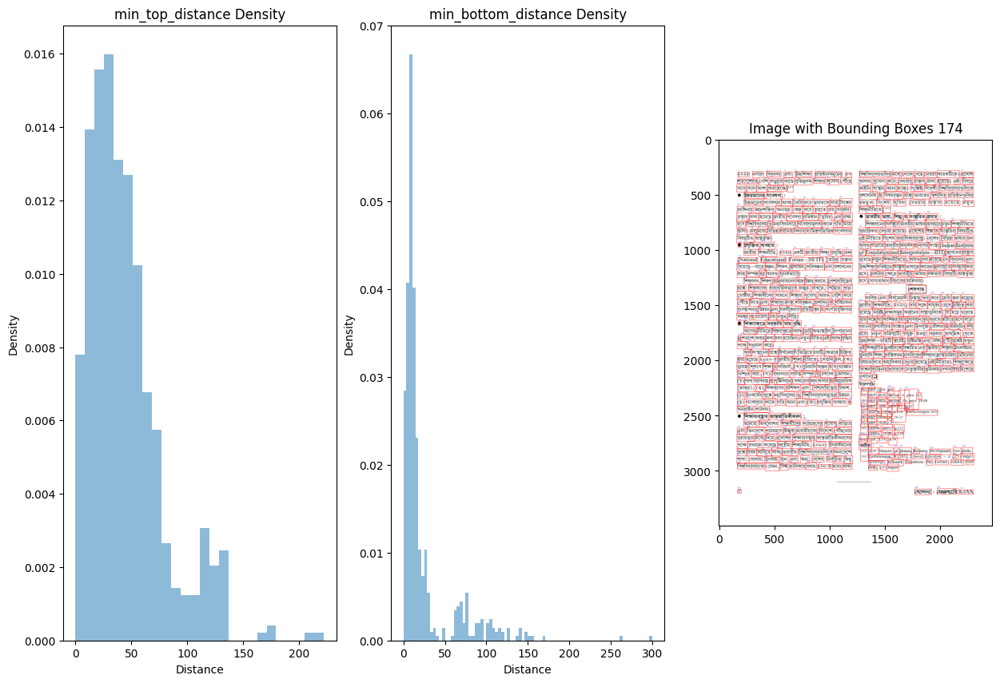

In [264]:
visualize_bboxes(image_id=174)

### For any 4 images of your choice from the dataset, experiment with different bandwidths . Visualize the density estimated and thresholded document for each of the hyperparameter settings per image

Image_ID : 101
Kernel : box
Bandwidth : 1

Thresholds :-
Top : 54.29837209508102
Bottom : 54.52430643386557
Left : 28.043401333210713
Right : 28.043401333210713


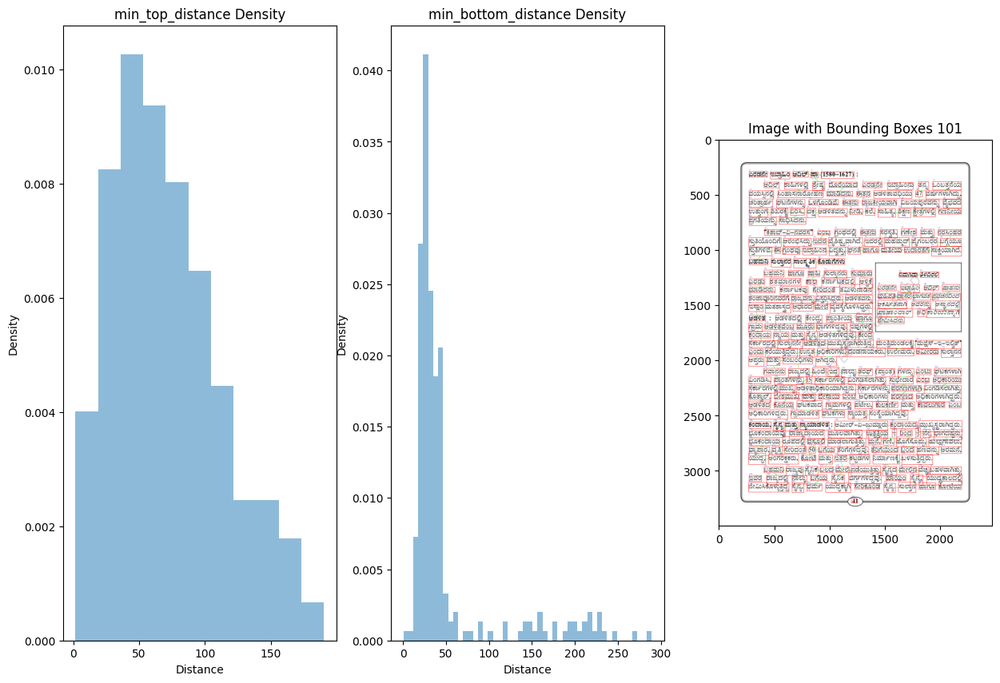

Image_ID : 101
Kernel : box
Bandwidth : 2

Thresholds :-
Top : 52.56083696685174
Bottom : 53.02541737436996
Left : 26.58129041071704
Right : 26.58129041071704


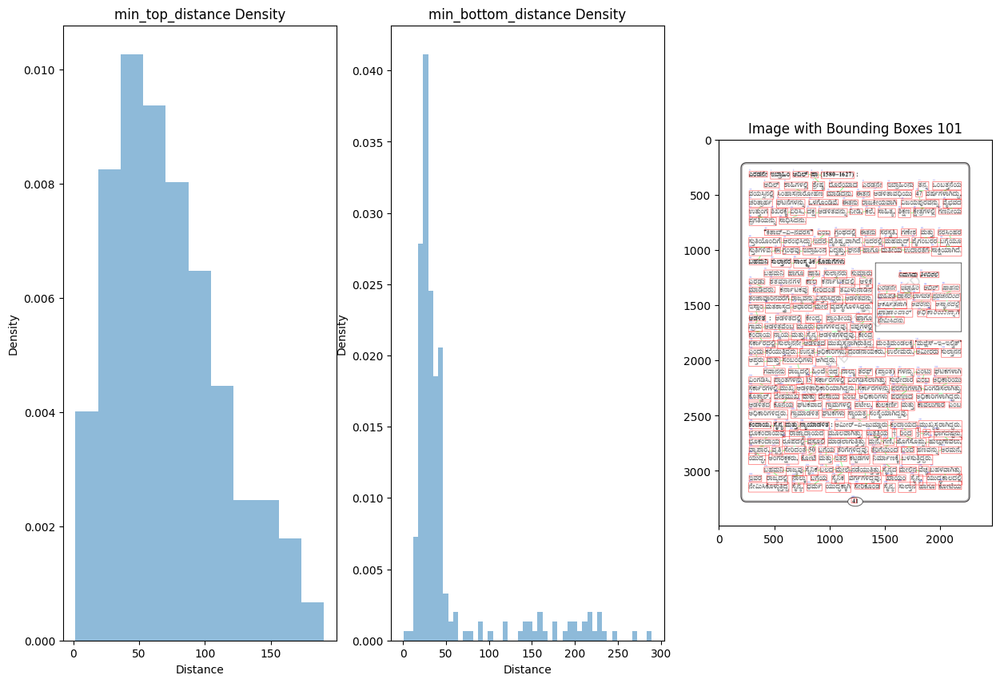

Image_ID : 101
Kernel : box
Bandwidth : 3

Thresholds :-
Top : 51.23170927615318
Bottom : 51.42011479312756
Left : 26.76125870754398
Right : 26.76125870754398


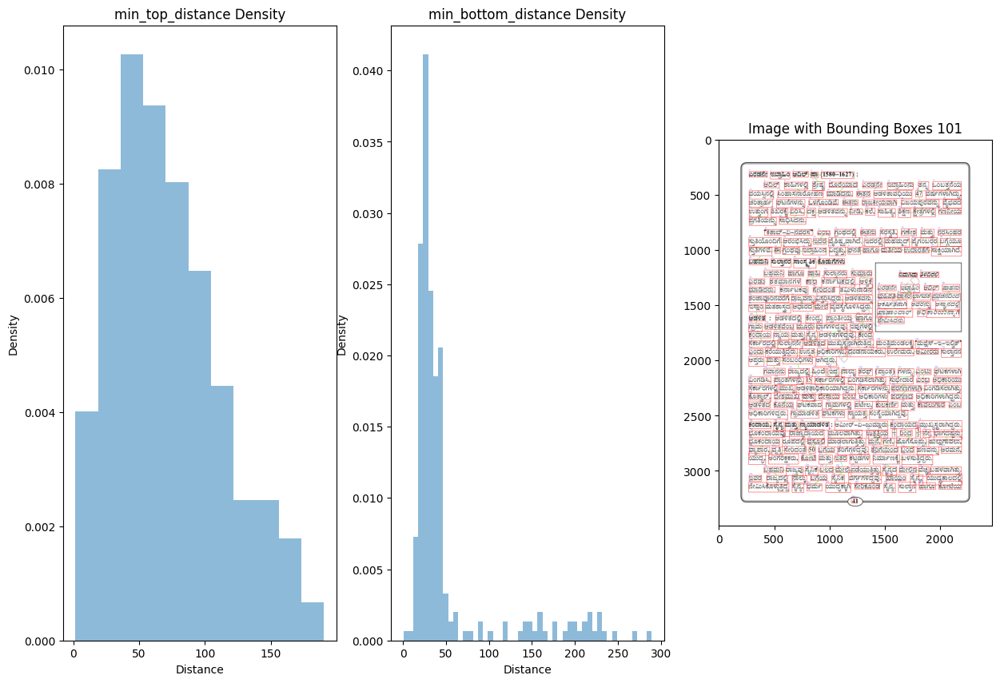

Image_ID : 101
Kernel : box
Bandwidth : 4

Thresholds :-
Top : 51.51635866255293
Bottom : 50.732374281448784
Left : 26.48533398759353
Right : 26.48533398759353


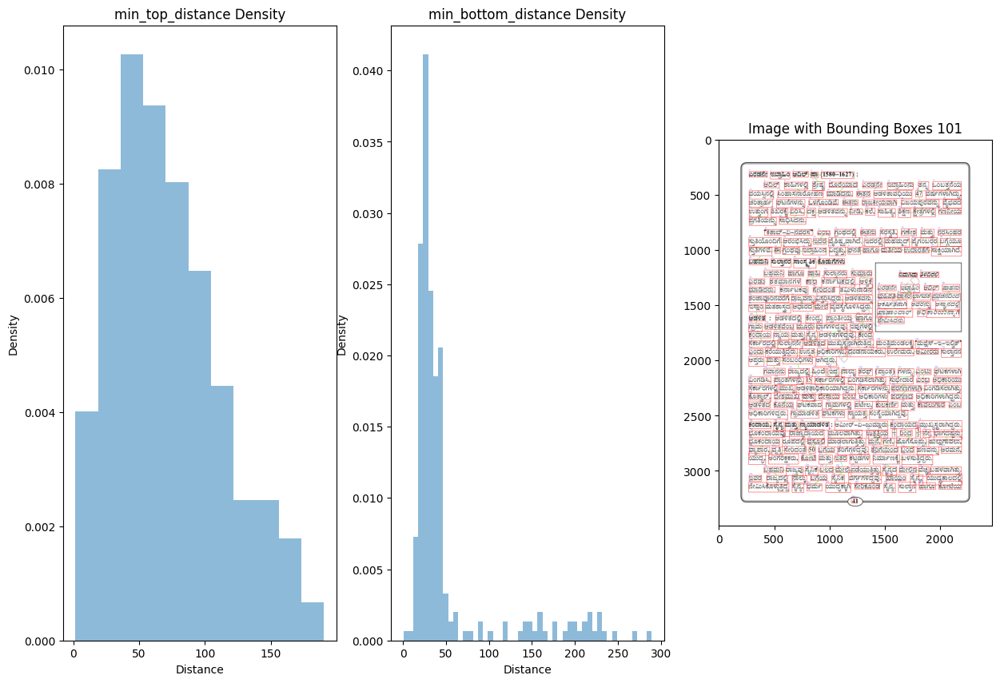

Image_ID : 101
Kernel : gaussian
Bandwidth : 1

Thresholds :-
Top : 51.82739641619312
Bottom : 49.17356142545049
Left : 26.253355322995528
Right : 26.253355322995528


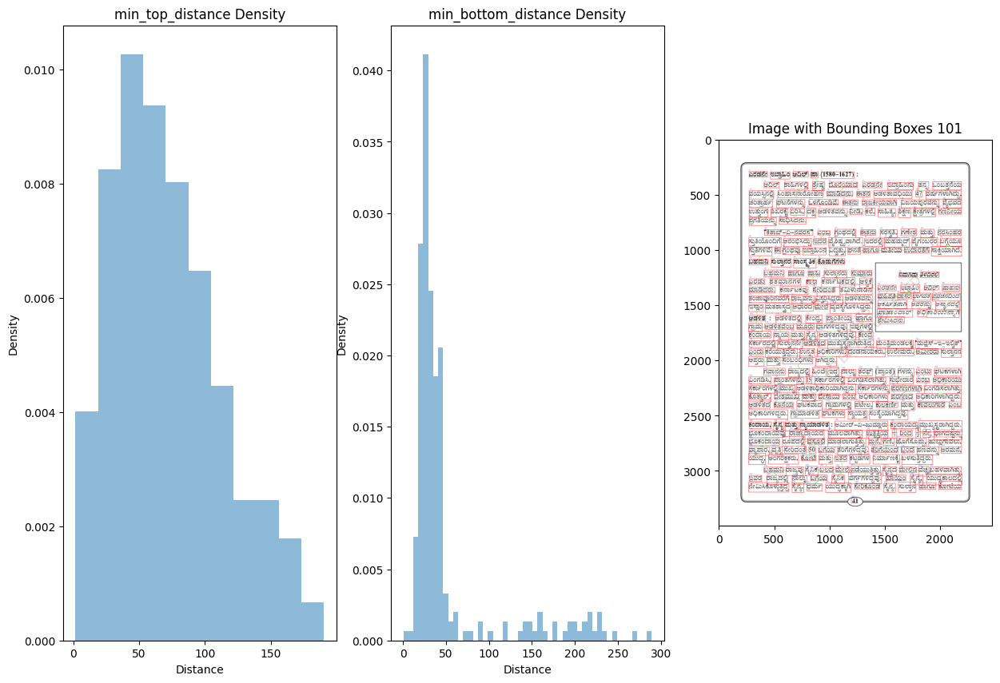

Image_ID : 101
Kernel : gaussian
Bandwidth : 2

Thresholds :-
Top : 51.18125051017994
Bottom : 50.30034447949853
Left : 26.06769465861829
Right : 26.06769465861829


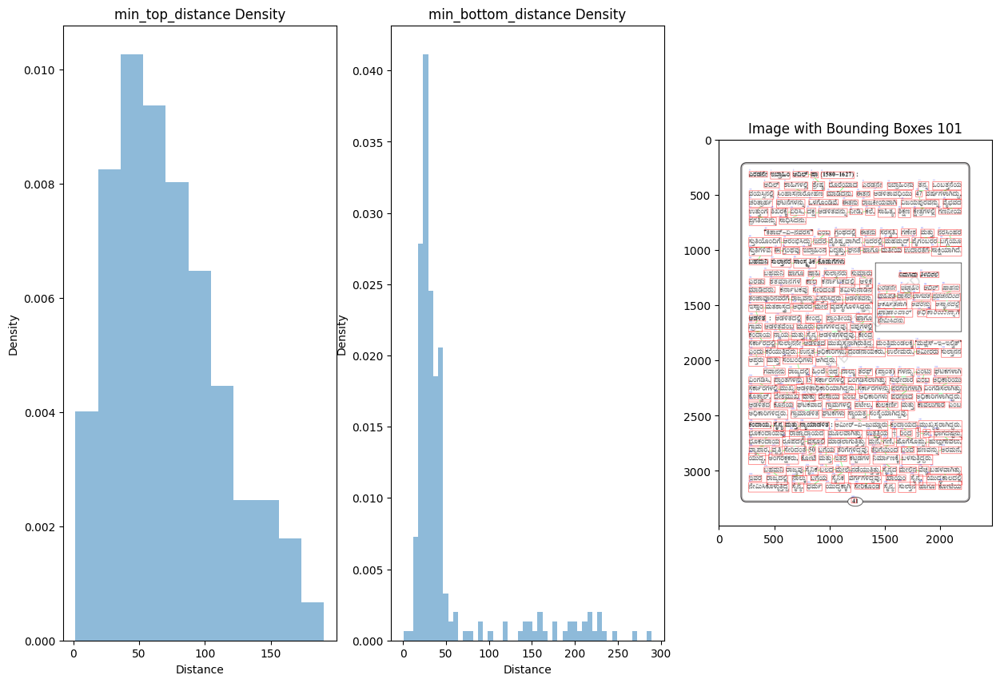

Image_ID : 101
Kernel : gaussian
Bandwidth : 3

Thresholds :-
Top : 45.66452768765733
Bottom : 45.215825717739484
Left : 26.37305459990326
Right : 26.37305459990326


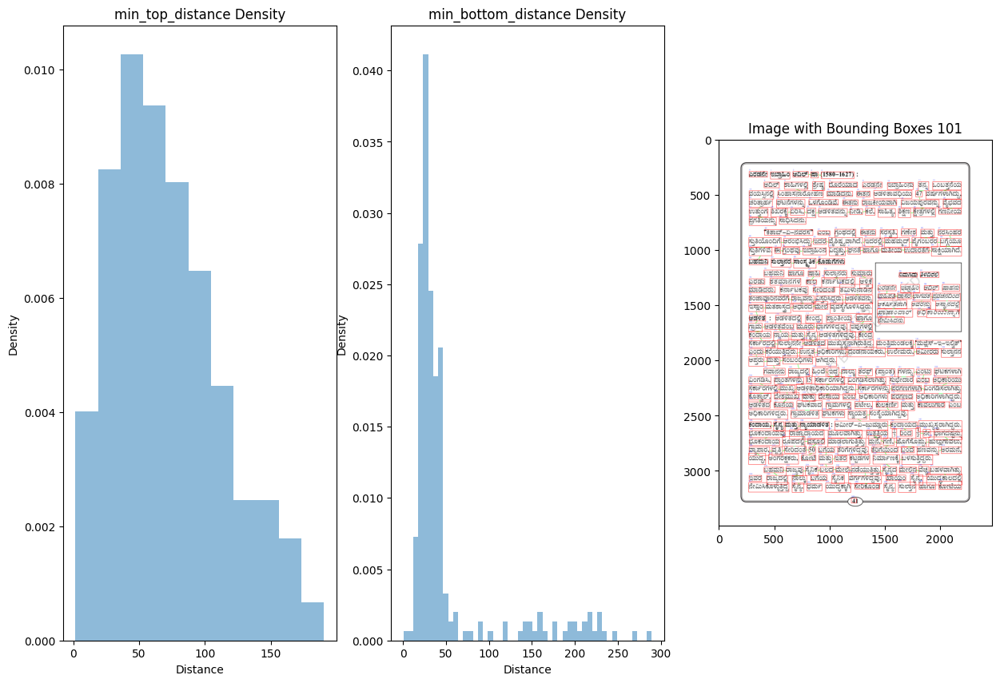

Image_ID : 101
Kernel : gaussian
Bandwidth : 4

Thresholds :-
Top : 46.00760565743243
Bottom : 45.77618523868576
Left : 26.692254817269795
Right : 26.692254817269795


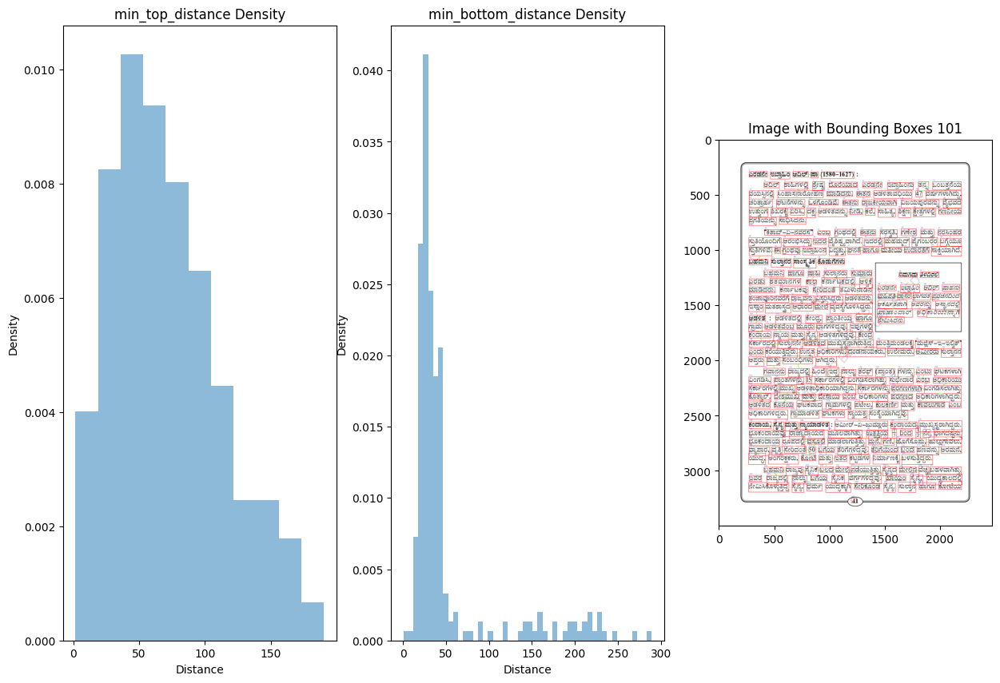

Image_ID : 101
Kernel : triangular
Bandwidth : 1

Thresholds :-
Top : 52.87854403097171
Bottom : 49.97063909285723
Left : 27.09076606349727
Right : 27.09076606349727


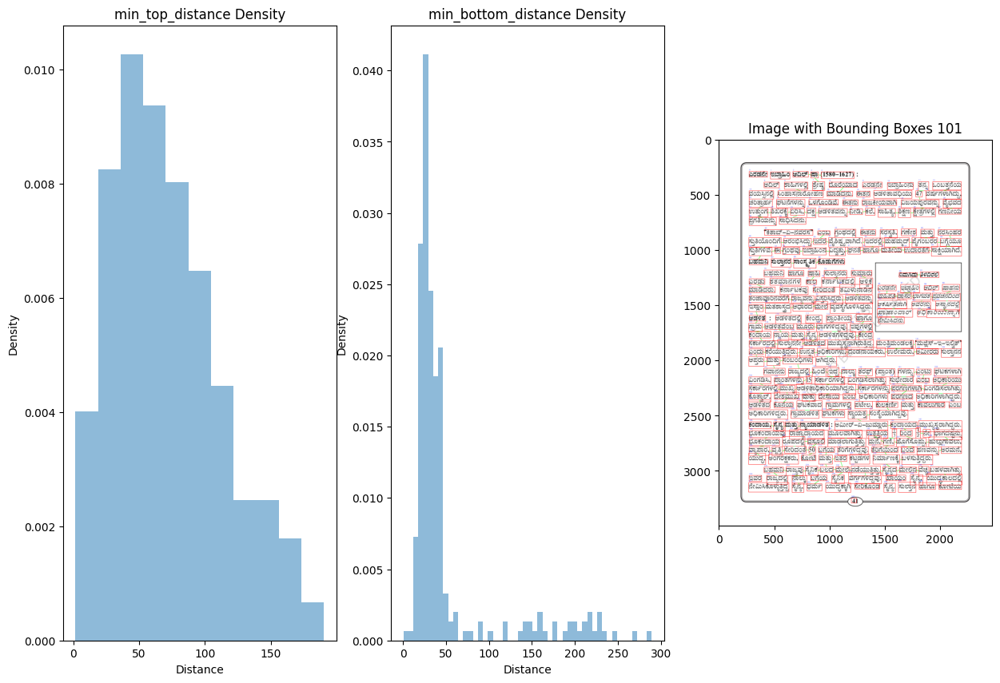

Image_ID : 101
Kernel : triangular
Bandwidth : 2

Thresholds :-
Top : 52.63728718020833
Bottom : 49.7261479768492
Left : 26.305209639912775
Right : 26.305209639912775


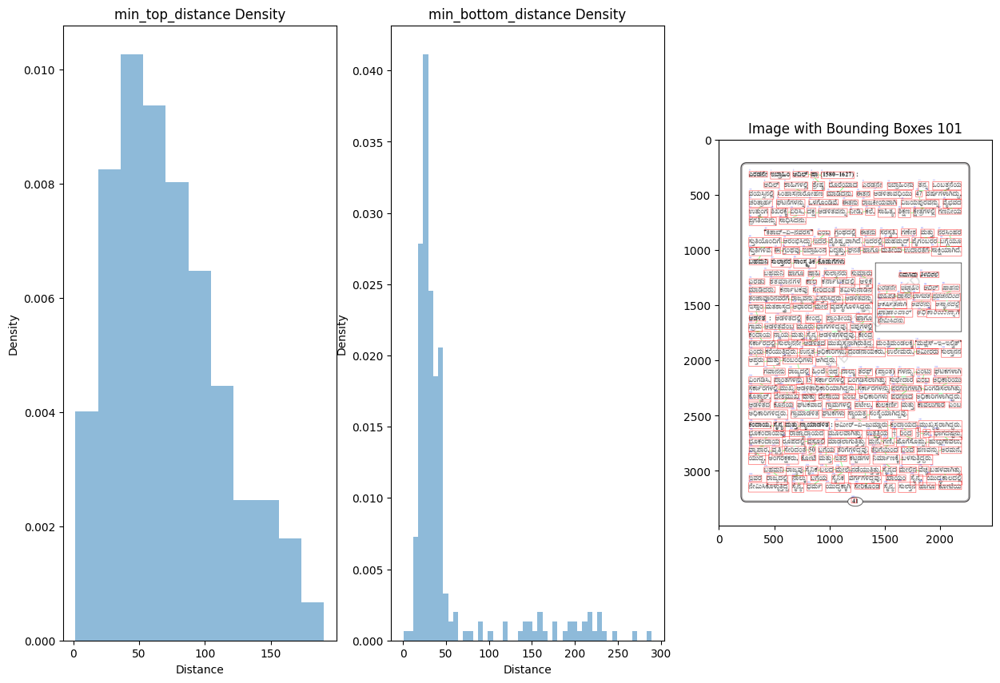

Image_ID : 101
Kernel : triangular
Bandwidth : 3

Thresholds :-
Top : 50.66249066762263
Bottom : 48.85069970503803
Left : 25.965117389069803
Right : 25.965117389069803


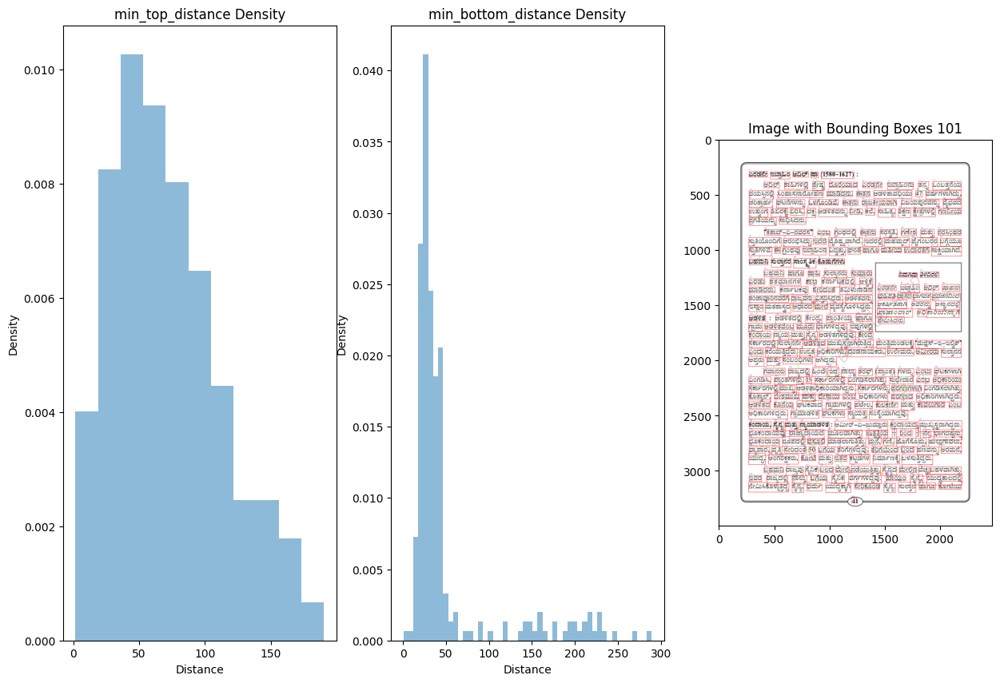

Image_ID : 101
Kernel : triangular
Bandwidth : 4

Thresholds :-
Top : 52.66873175871086
Bottom : 51.146643659870314
Left : 26.06769465861829
Right : 26.06769465861829


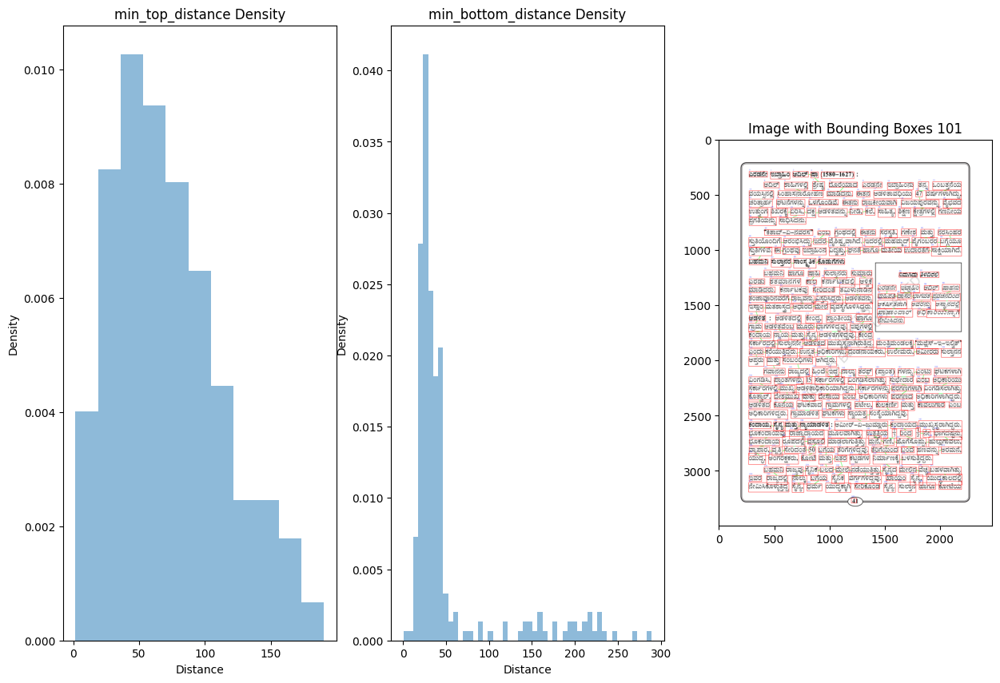

Image_ID : 152
Kernel : box
Bandwidth : 1

Thresholds :-
Top : 85.45944987803996
Bottom : 80.47101444966013
Left : 27.834544242780453
Right : 27.834544242780453


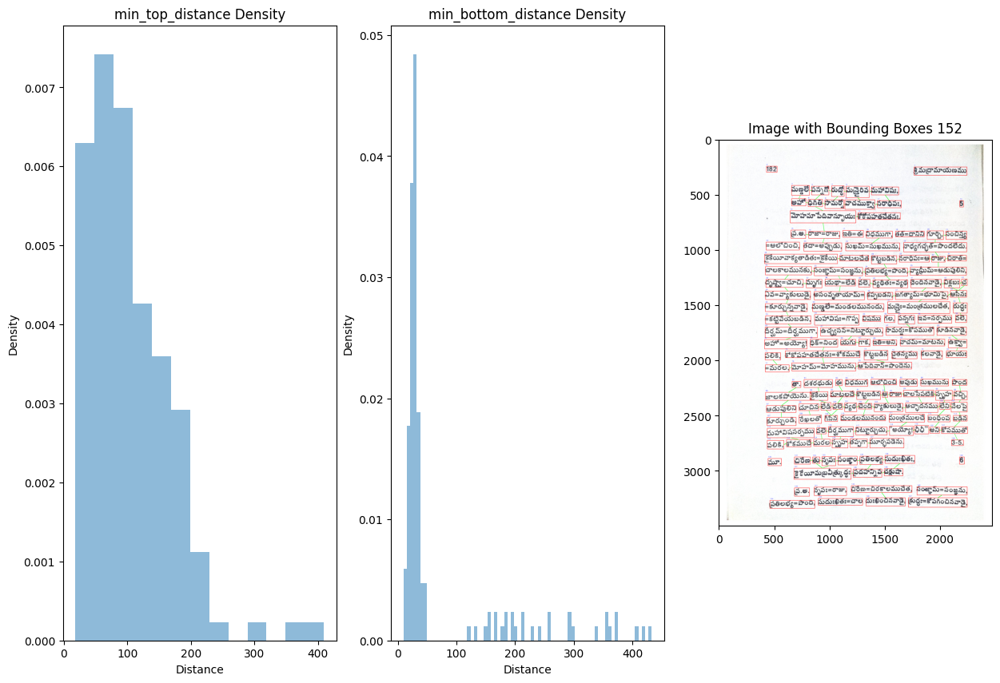

Image_ID : 152
Kernel : box
Bandwidth : 2

Thresholds :-
Top : 84.72884128257566
Bottom : 72.76986181963603
Left : 27.231671947669415
Right : 27.231671947669415


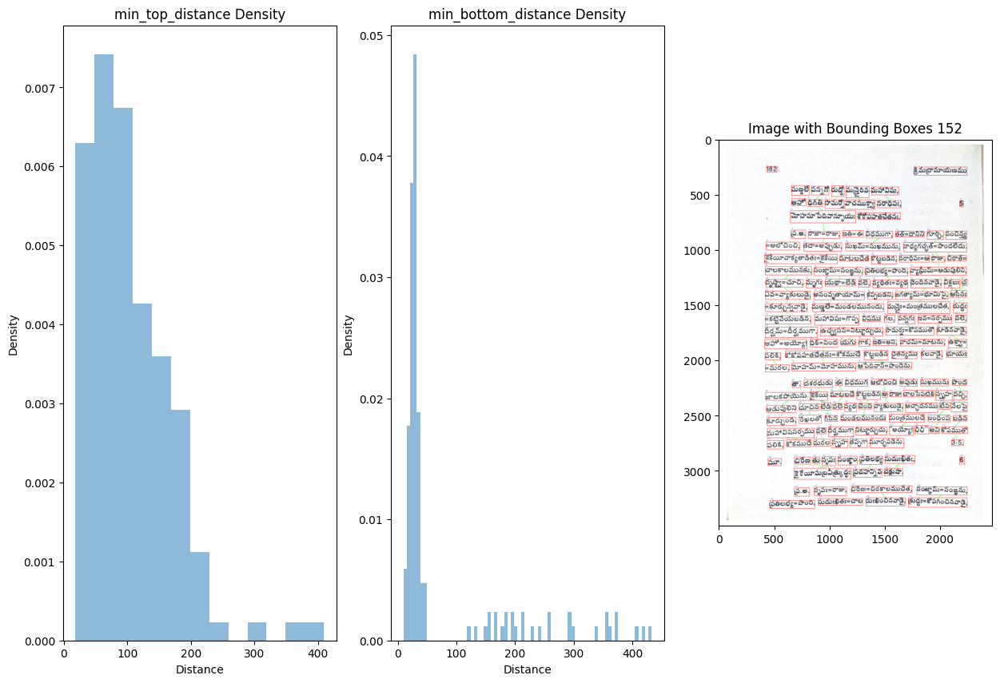

Image_ID : 152
Kernel : box
Bandwidth : 3

Thresholds :-
Top : 85.38929401814507
Bottom : 77.61889161981321
Left : 27.399479250003097
Right : 27.399479250003097


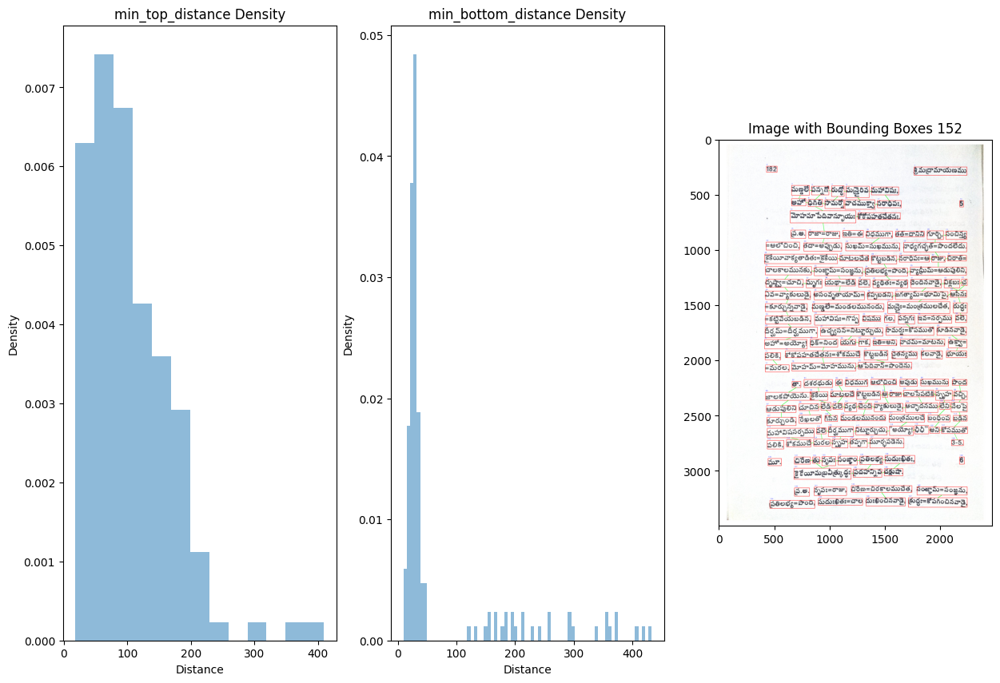

Image_ID : 152
Kernel : box
Bandwidth : 4

Thresholds :-
Top : 84.67020543496908
Bottom : 74.47757017023089
Left : 27.681872668973185
Right : 27.681872668973185


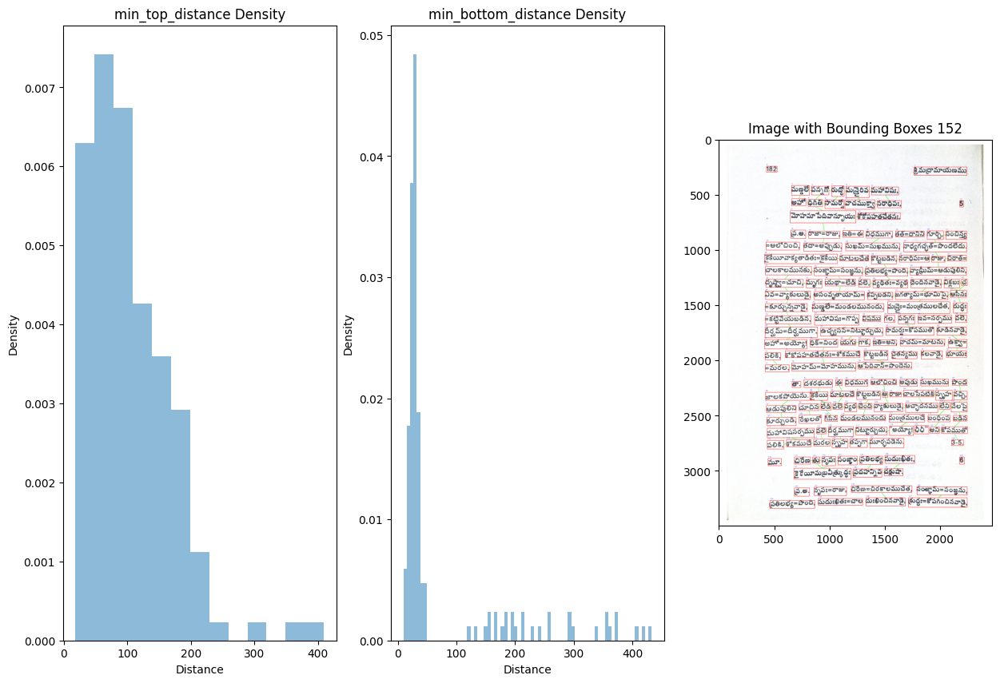

Image_ID : 152
Kernel : gaussian
Bandwidth : 1

Thresholds :-
Top : 83.13512680245105
Bottom : 73.54841615095289
Left : 27.476159480726896
Right : 27.476159480726896


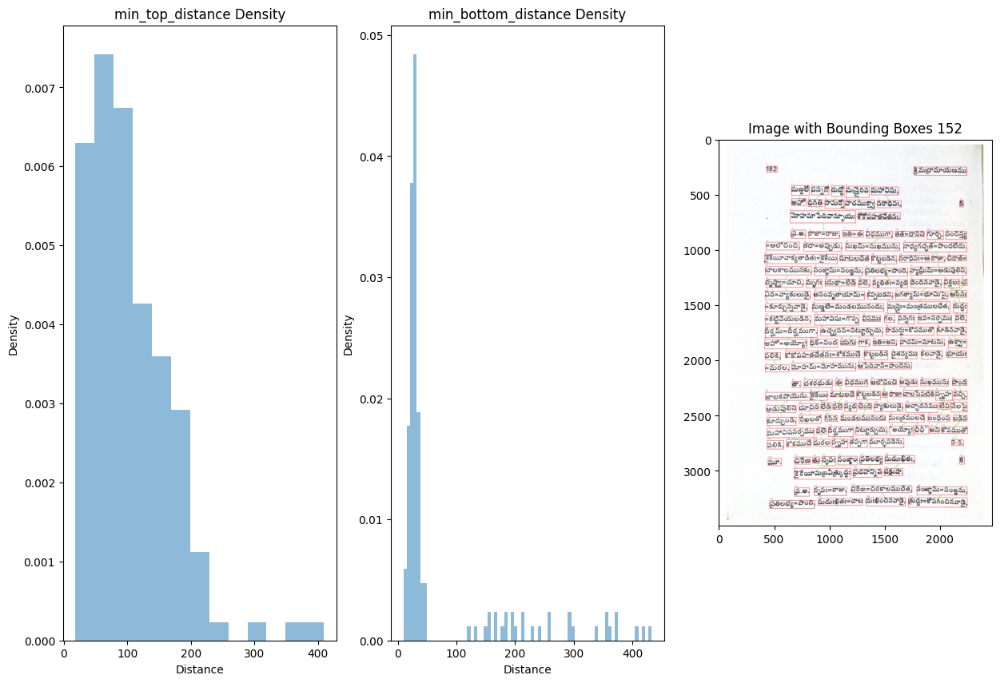

Image_ID : 152
Kernel : gaussian
Bandwidth : 2

Thresholds :-
Top : 78.77756300353818
Bottom : 67.45820047908096
Left : 27.87061871642535
Right : 27.87061871642535


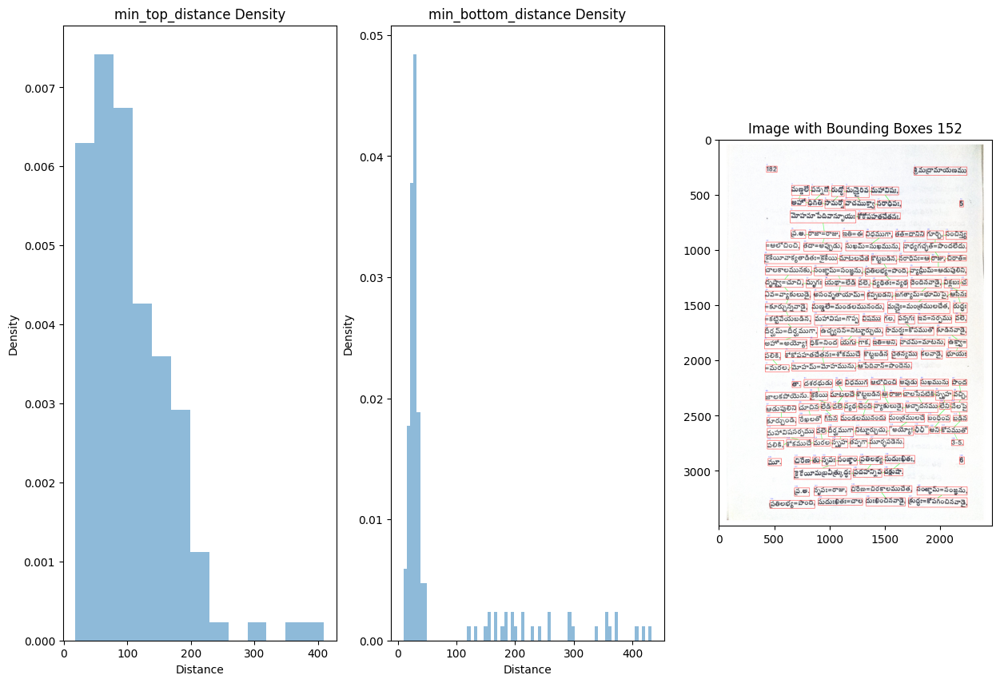

Image_ID : 152
Kernel : gaussian
Bandwidth : 3

Thresholds :-
Top : 66.24622122584456
Bottom : 62.84204490780134
Left : 27.87061871642535
Right : 27.87061871642535


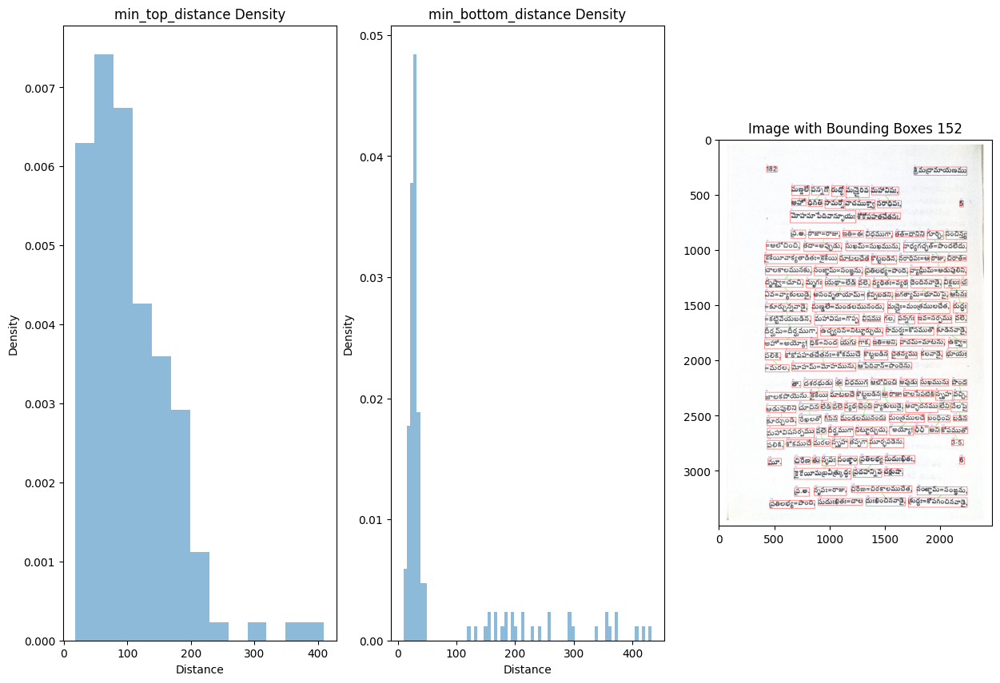

Image_ID : 152
Kernel : gaussian
Bandwidth : 4

Thresholds :-
Top : 64.52809859749861
Bottom : 63.71436214545009
Left : 27.70957785645237
Right : 27.70957785645237


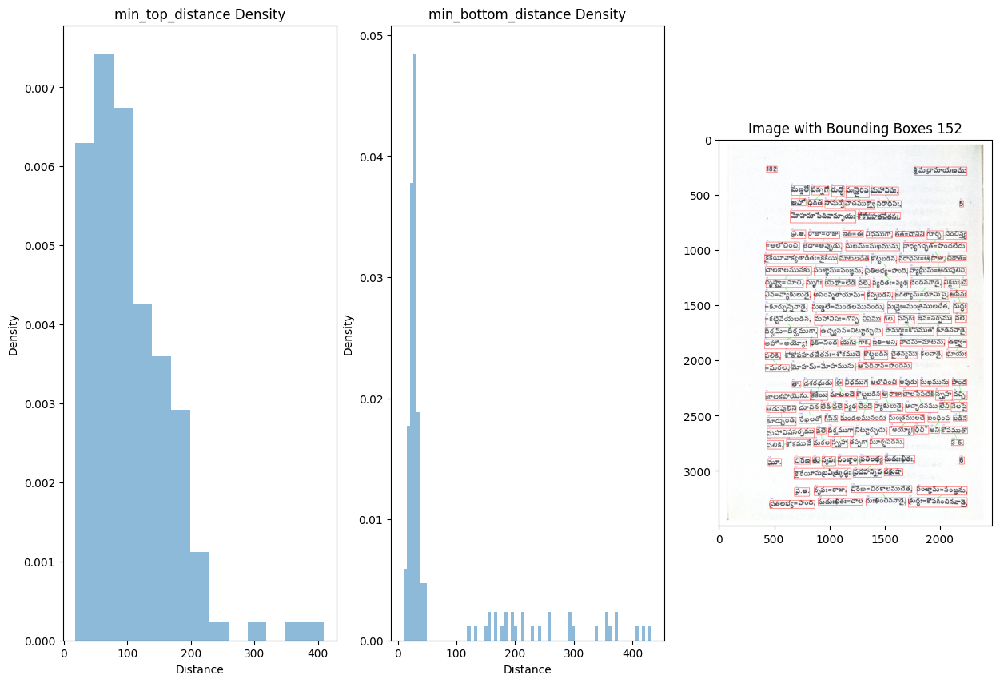

Image_ID : 152
Kernel : triangular
Bandwidth : 1

Thresholds :-
Top : 83.76226689220864
Bottom : 82.37694837815904
Left : 27.437544906810224
Right : 27.437544906810224


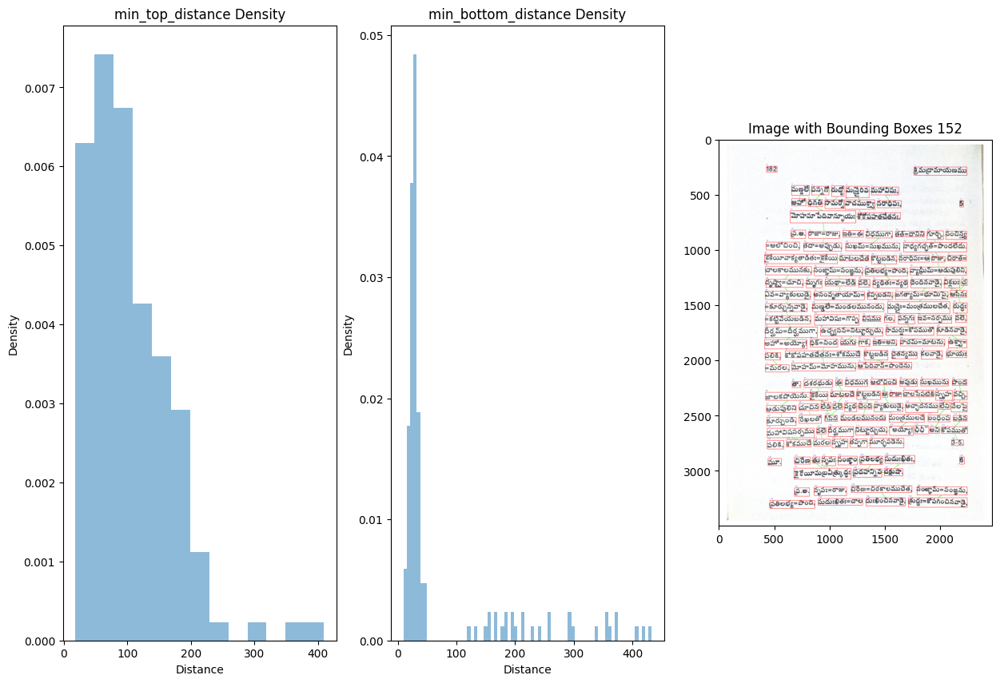

Image_ID : 152
Kernel : triangular
Bandwidth : 2

Thresholds :-
Top : 85.58465241824196
Bottom : 72.41846482018254
Left : 27.648019821988587
Right : 27.648019821988587


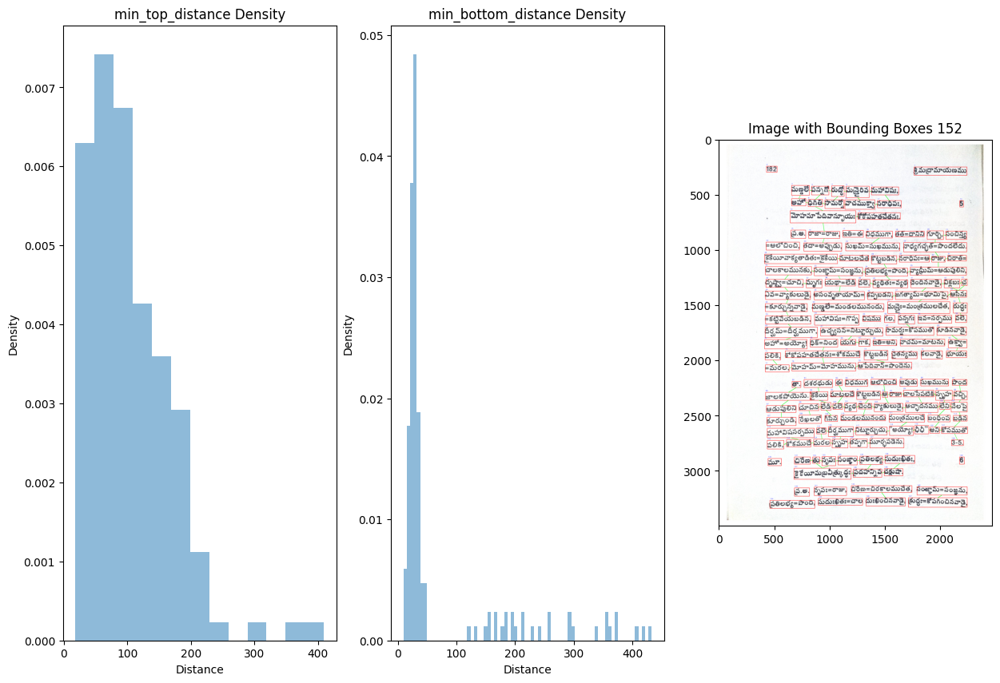

Image_ID : 152
Kernel : triangular
Bandwidth : 3

Thresholds :-
Top : 82.45184518424551
Bottom : 73.40953003642694
Left : 27.854786757802387
Right : 27.854786757802387


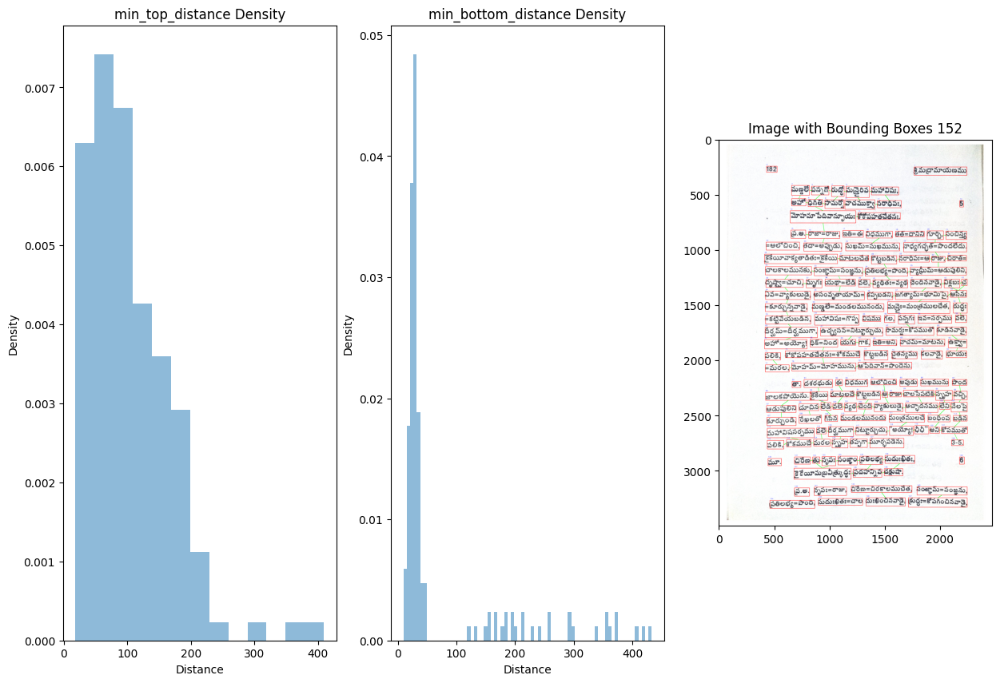

Image_ID : 152
Kernel : triangular
Bandwidth : 4

Thresholds :-
Top : 81.60927352977991
Bottom : 68.1390865233178
Left : 28.132735489173538
Right : 28.132735489173538


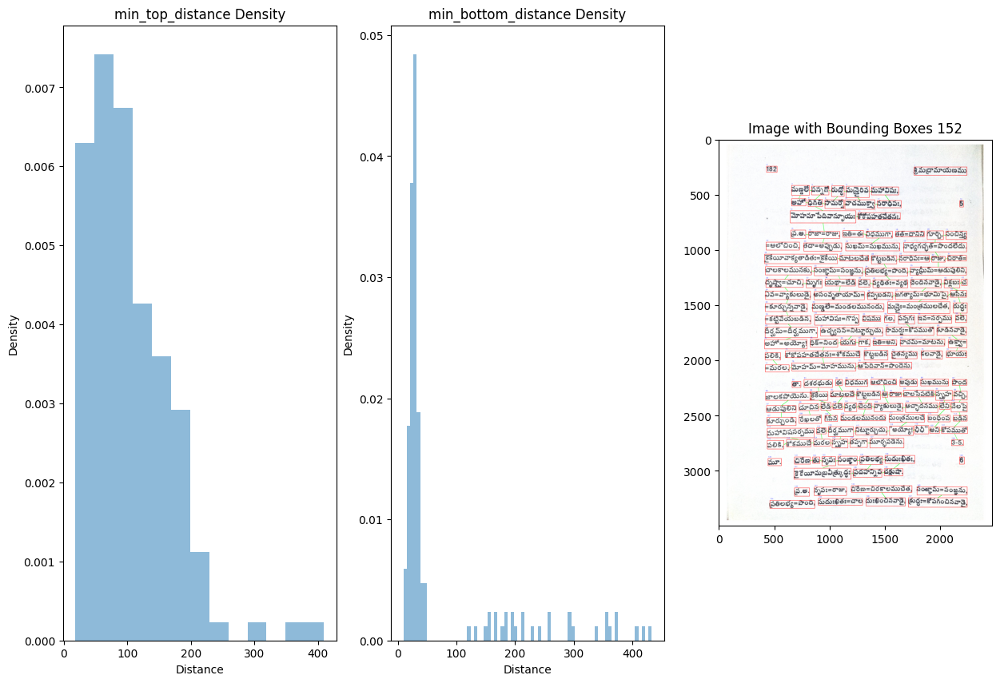

Image_ID : 159
Kernel : box
Bandwidth : 1

Thresholds :-
Top : 108.62638154210212
Bottom : 109.27208215391322
Left : 24.445022875369403
Right : 24.445022875369403


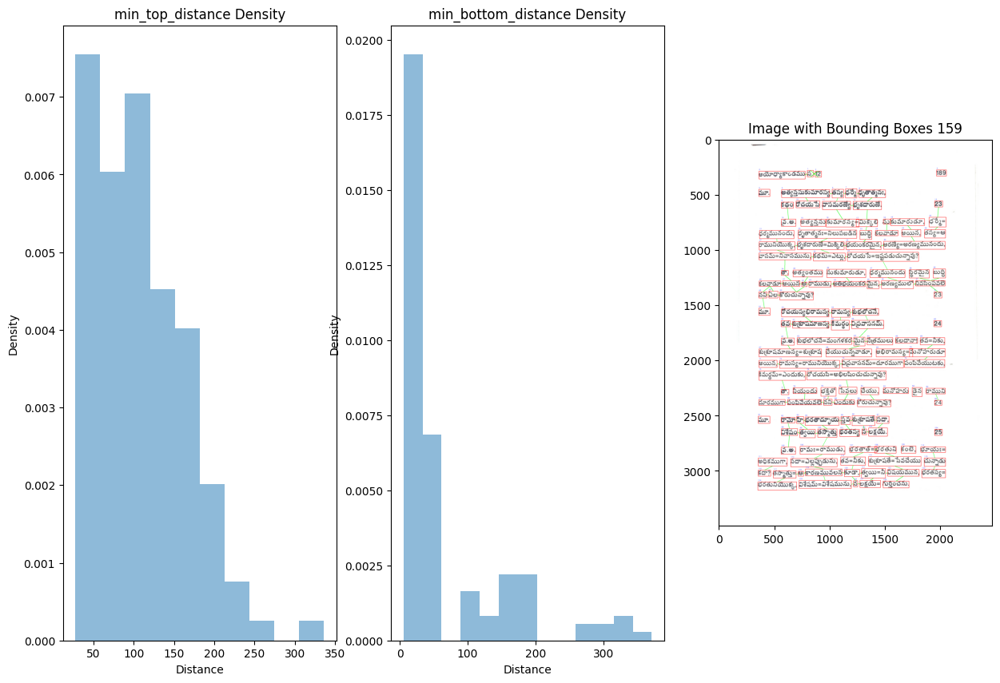

Image_ID : 159
Kernel : box
Bandwidth : 2

Thresholds :-
Top : 95.04281997153379
Bottom : 96.02650834930216
Left : 21.619436724593044
Right : 21.619436724593044


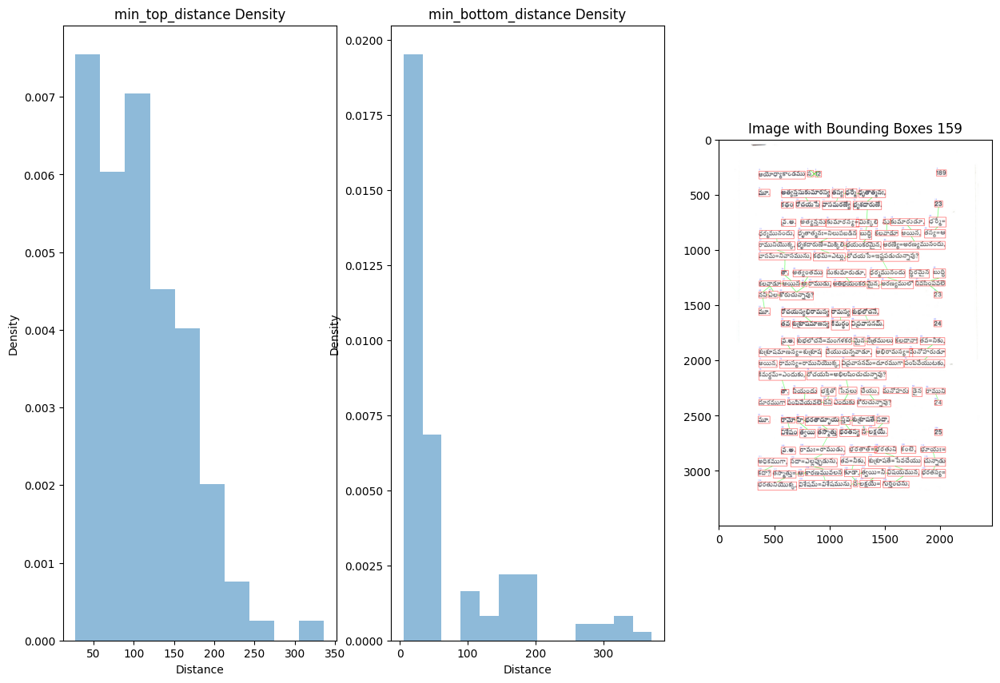

Image_ID : 159
Kernel : box
Bandwidth : 3

Thresholds :-
Top : 89.9450261207852
Bottom : 90.46805427272635
Left : 21.377497971736
Right : 21.377497971736


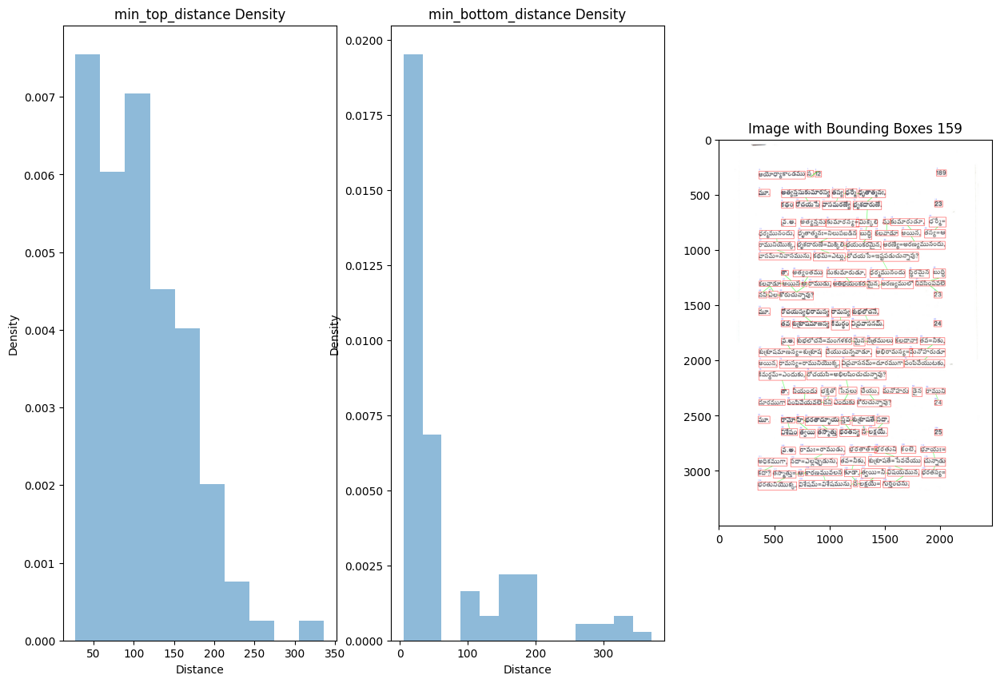

Image_ID : 159
Kernel : box
Bandwidth : 4

Thresholds :-
Top : 91.5134533647975
Bottom : 89.4614390247958
Left : 21.461680625038614
Right : 21.461680625038614


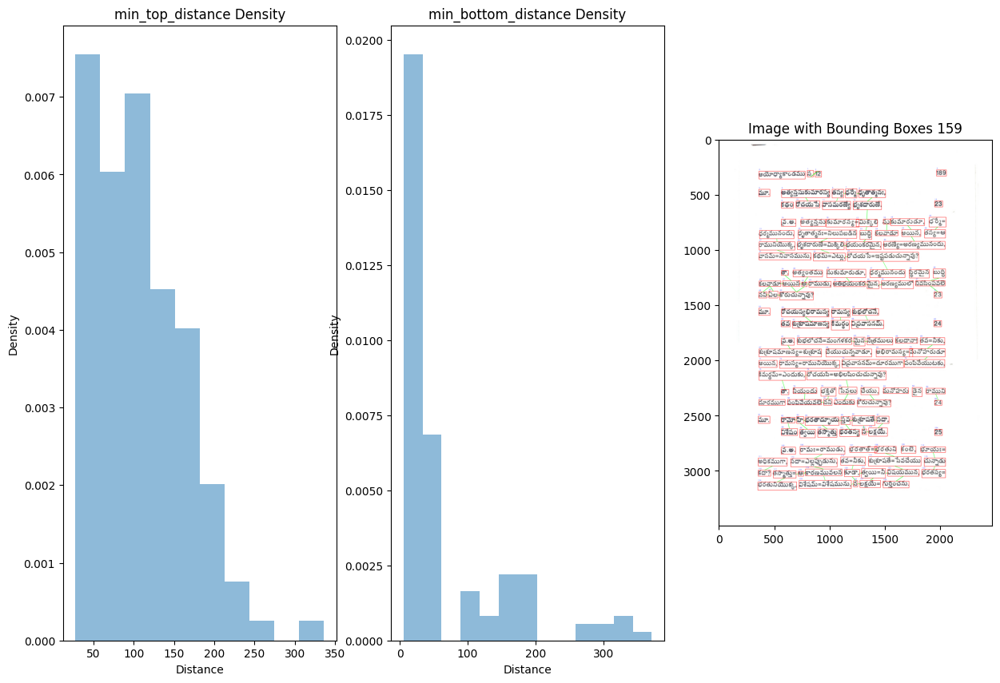

Image_ID : 159
Kernel : gaussian
Bandwidth : 1

Thresholds :-
Top : 90.96832381905156
Bottom : 92.62777065834399
Left : 21.28712659386918
Right : 21.28712659386918


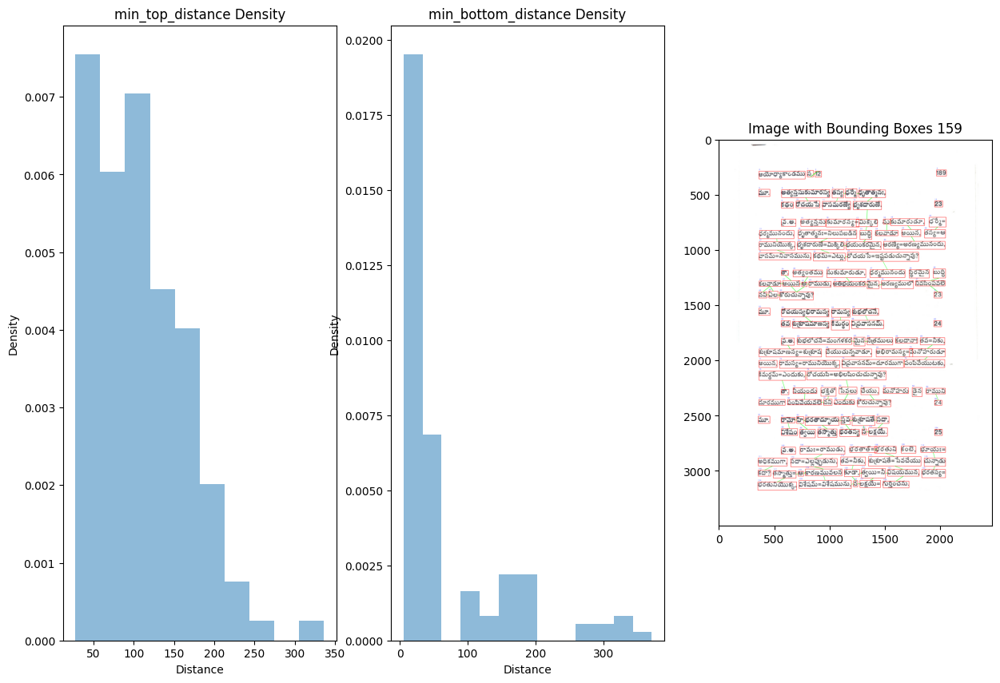

Image_ID : 159
Kernel : gaussian
Bandwidth : 2

Thresholds :-
Top : 82.51634500948171
Bottom : 75.91641475806603
Left : 21.461680625038614
Right : 21.461680625038614


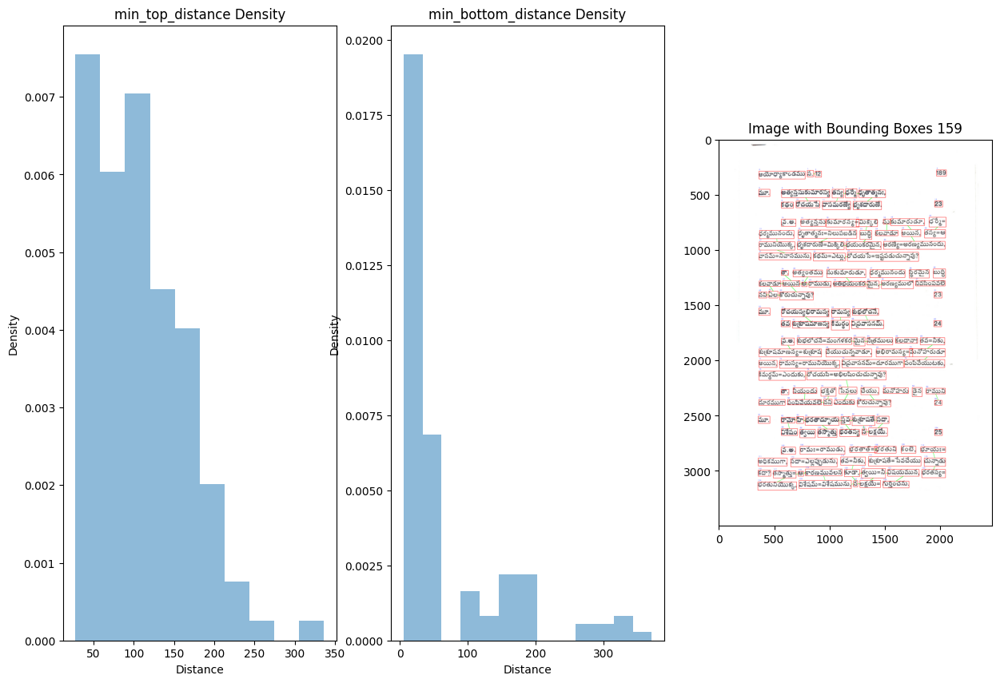

Image_ID : 159
Kernel : gaussian
Bandwidth : 3

Thresholds :-
Top : 80.50017918431453
Bottom : 78.52747009040101
Left : 21.645980248085078
Right : 21.645980248085078


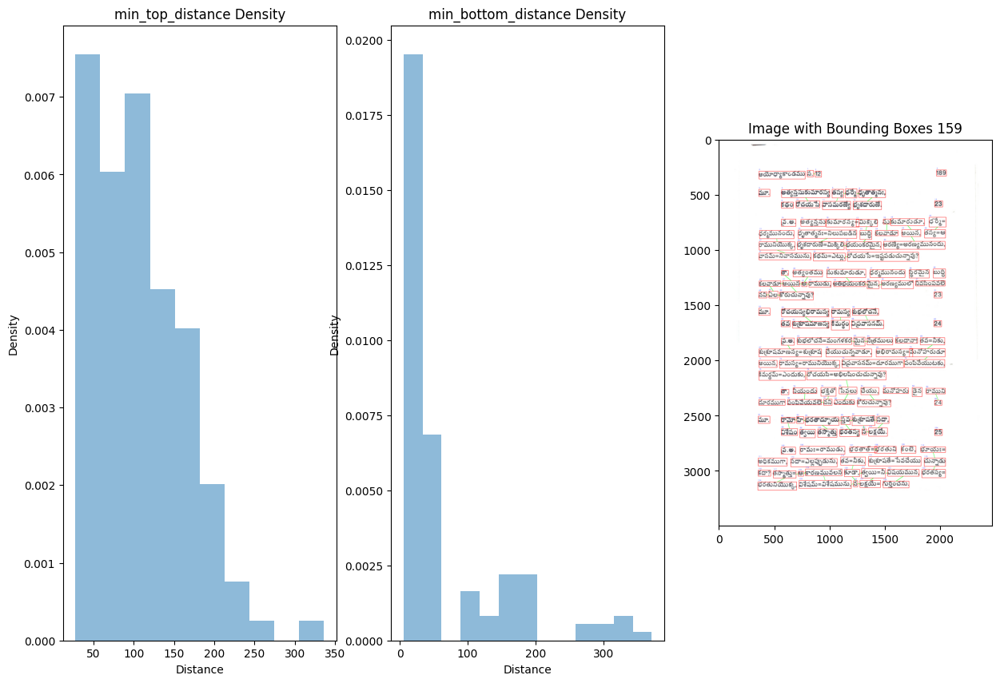

Image_ID : 159
Kernel : gaussian
Bandwidth : 4

Thresholds :-
Top : 83.92233931705017
Bottom : 80.63290102409145
Left : 22.02394998621524
Right : 22.02394998621524


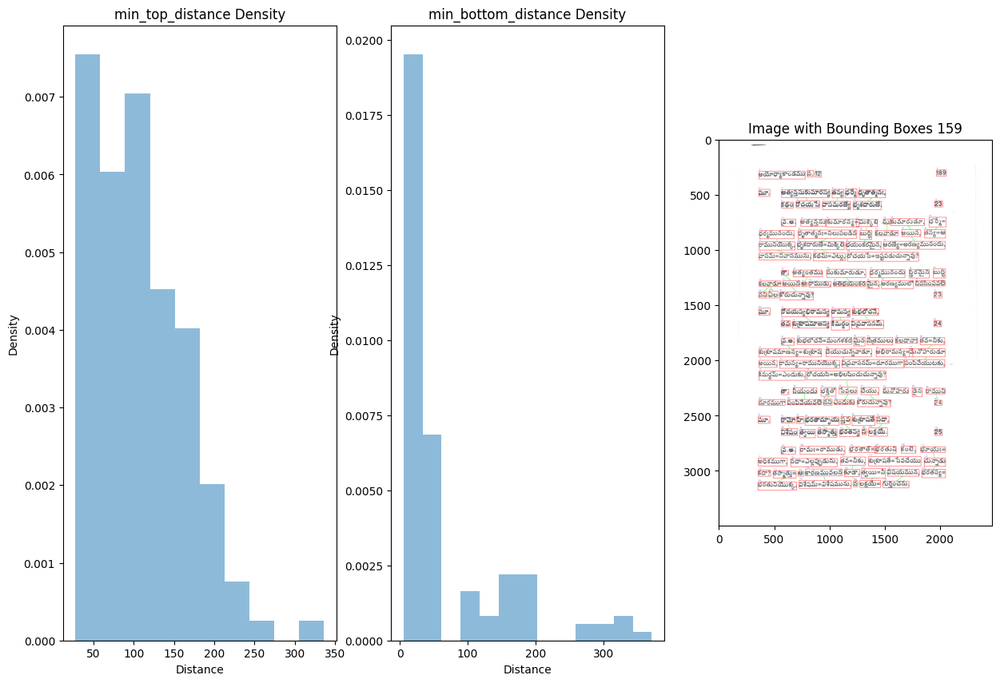

Image_ID : 159
Kernel : triangular
Bandwidth : 1

Thresholds :-
Top : 95.01861463312686
Bottom : 101.10559186136744
Left : 23.58716489297138
Right : 23.58716489297138


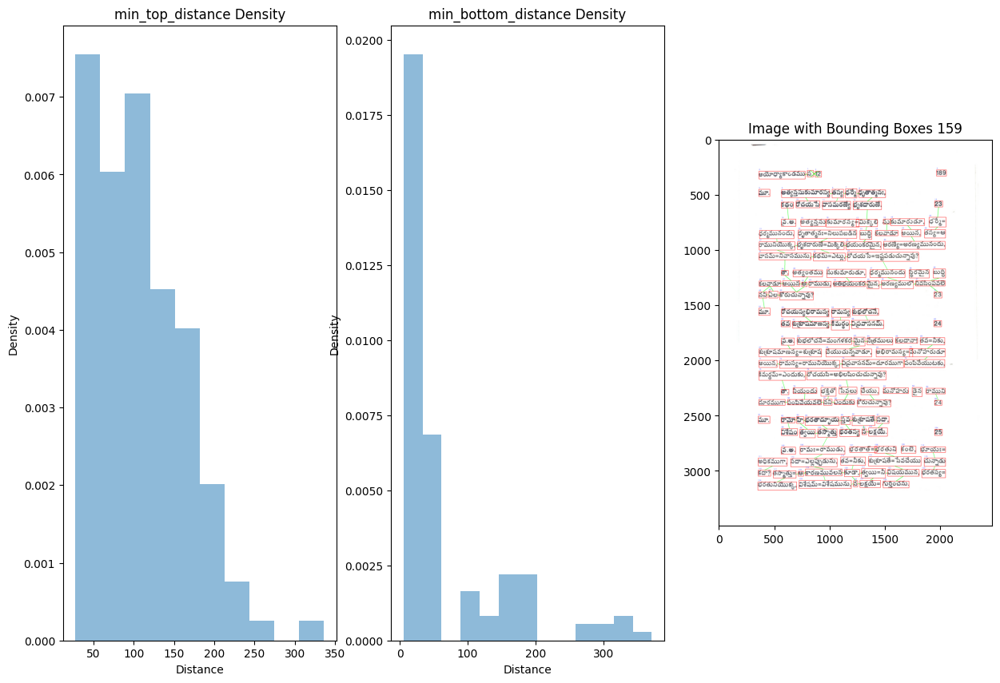

Image_ID : 159
Kernel : triangular
Bandwidth : 2

Thresholds :-
Top : 92.11816532292131
Bottom : 93.50206330293909
Left : 21.28712659386918
Right : 21.28712659386918


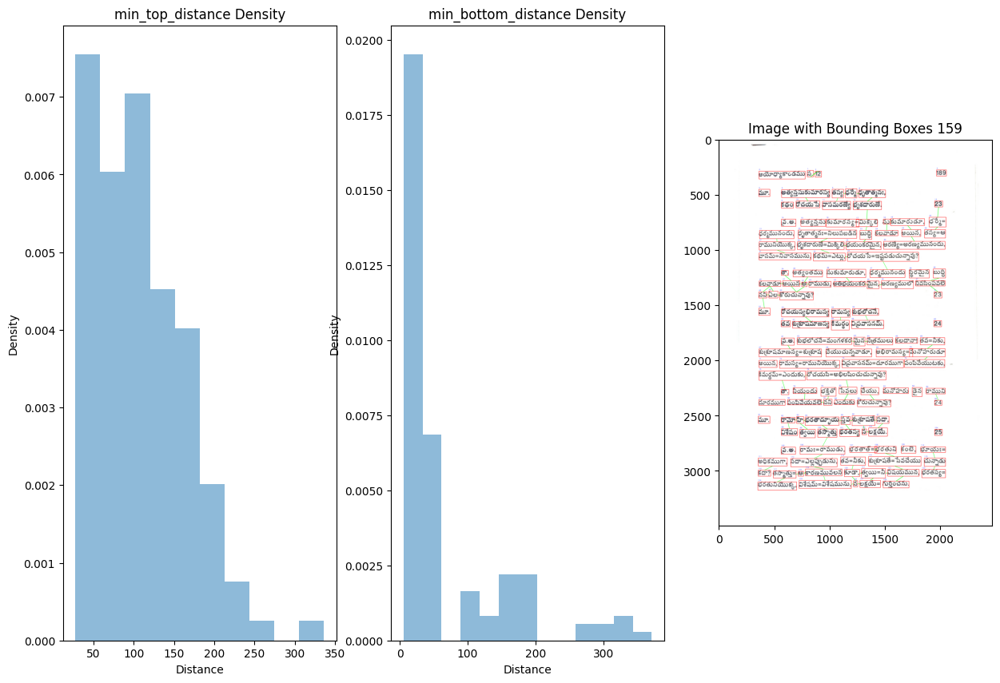

Image_ID : 159
Kernel : triangular
Bandwidth : 3

Thresholds :-
Top : 87.93448096651666
Bottom : 85.81037375928008
Left : 21.28712659386918
Right : 21.28712659386918


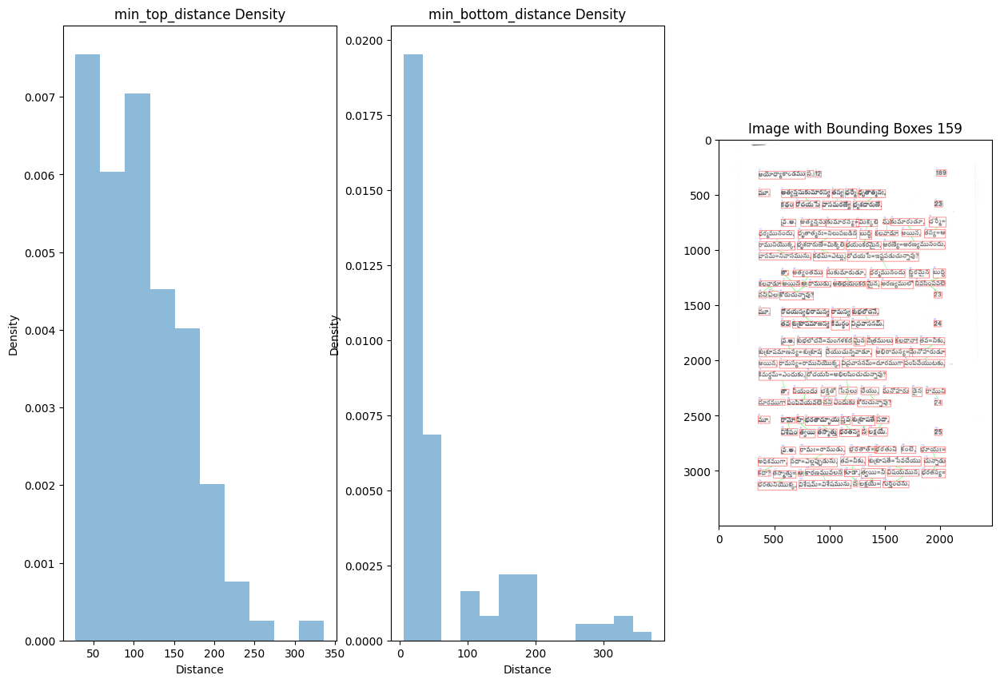

Image_ID : 159
Kernel : triangular
Bandwidth : 4

Thresholds :-
Top : 85.726597471006
Bottom : 80.19491883401923
Left : 21.461680625038614
Right : 21.461680625038614


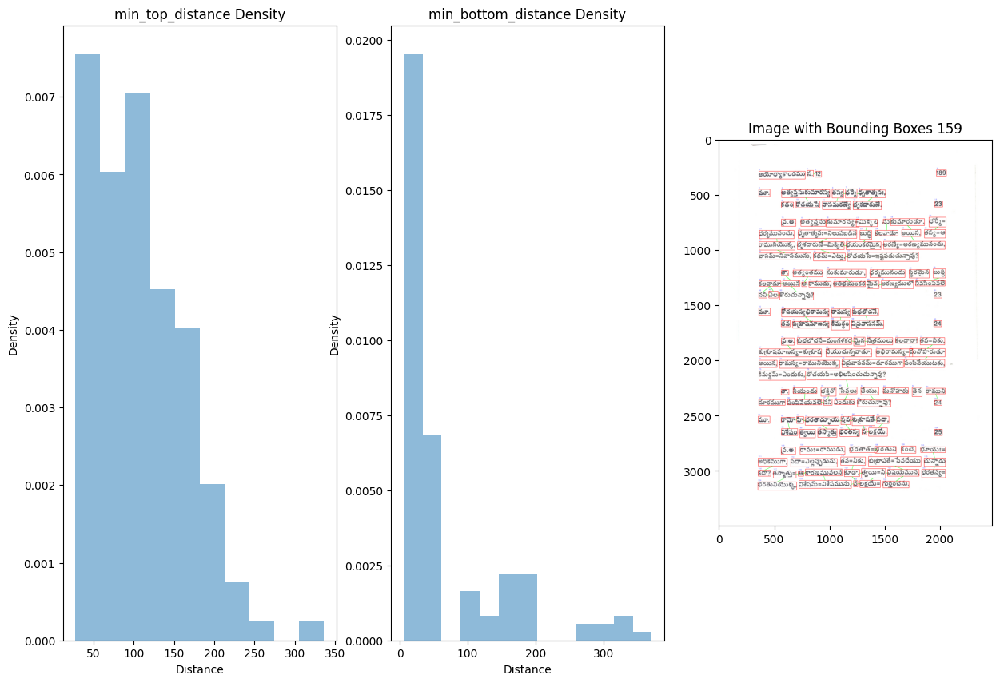

Image_ID : 201
Kernel : box
Bandwidth : 1

Thresholds :-
Top : 39.05658323383648
Bottom : 35.82091712221914
Left : 25.527784589059237
Right : 25.302245780342293


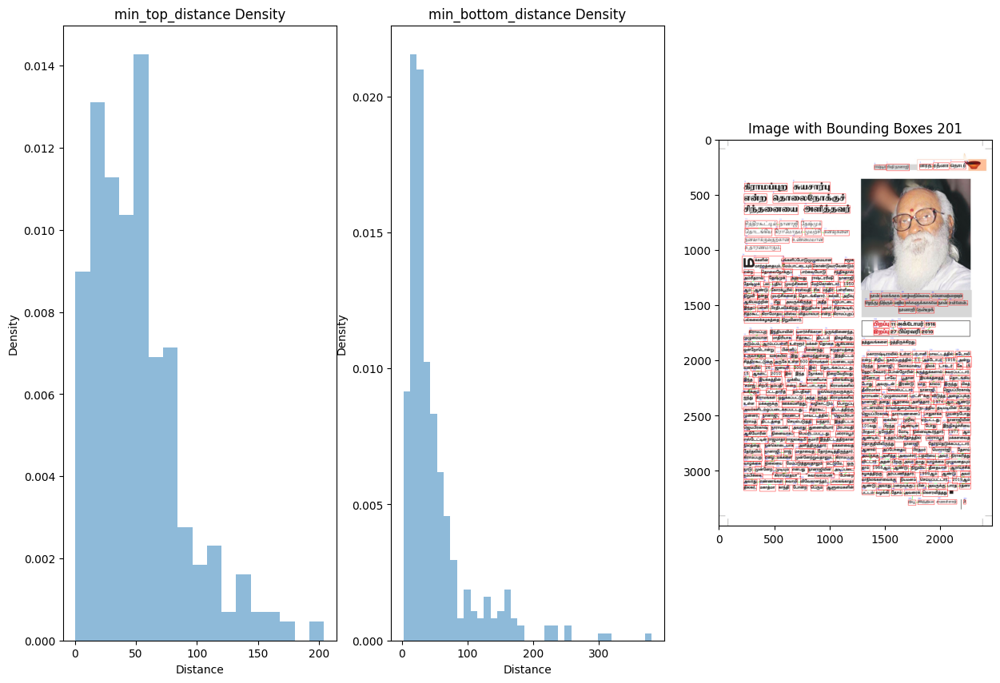

Image_ID : 201
Kernel : box
Bandwidth : 2

Thresholds :-
Top : 35.82876903245707
Bottom : 33.93991339579994
Left : 23.982321657577565
Right : 25.161441063721764


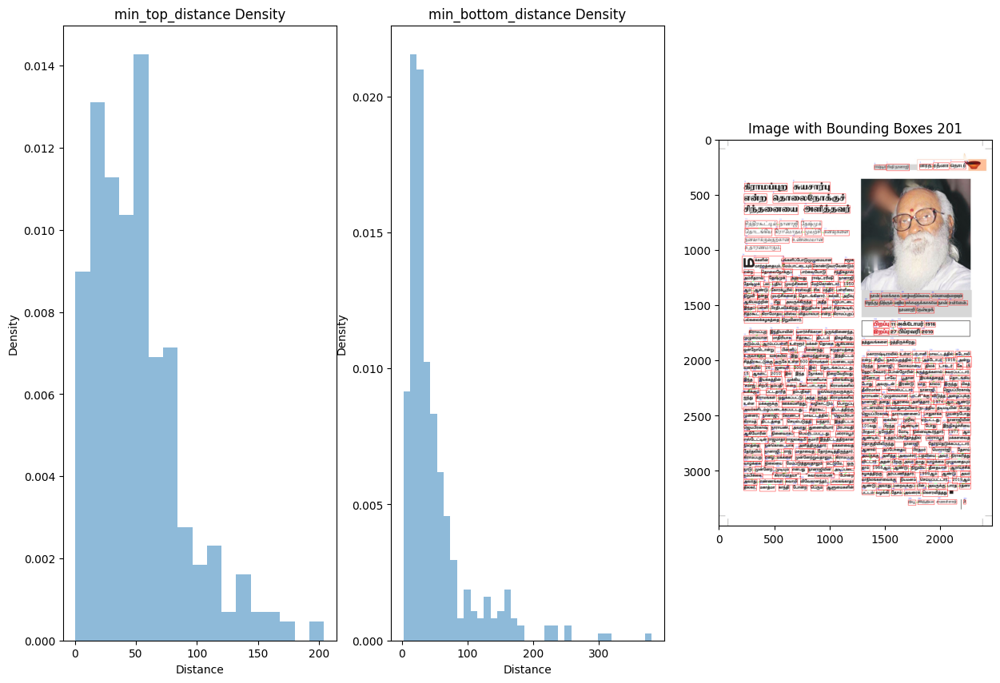

Image_ID : 201
Kernel : box
Bandwidth : 3

Thresholds :-
Top : 36.64928558587284
Bottom : 32.93346745706936
Left : 24.044849758957177
Right : 23.98185872801038


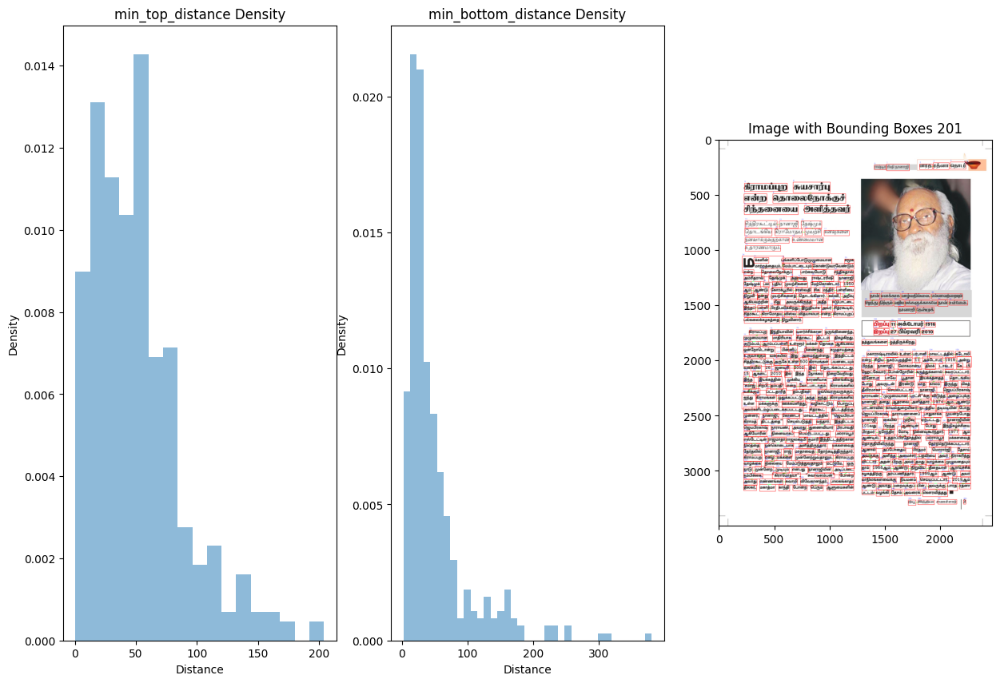

Image_ID : 201
Kernel : box
Bandwidth : 4

Thresholds :-
Top : 36.83213959455909
Bottom : 34.79210677243236
Left : 23.762318970928927
Right : 23.57643081766528


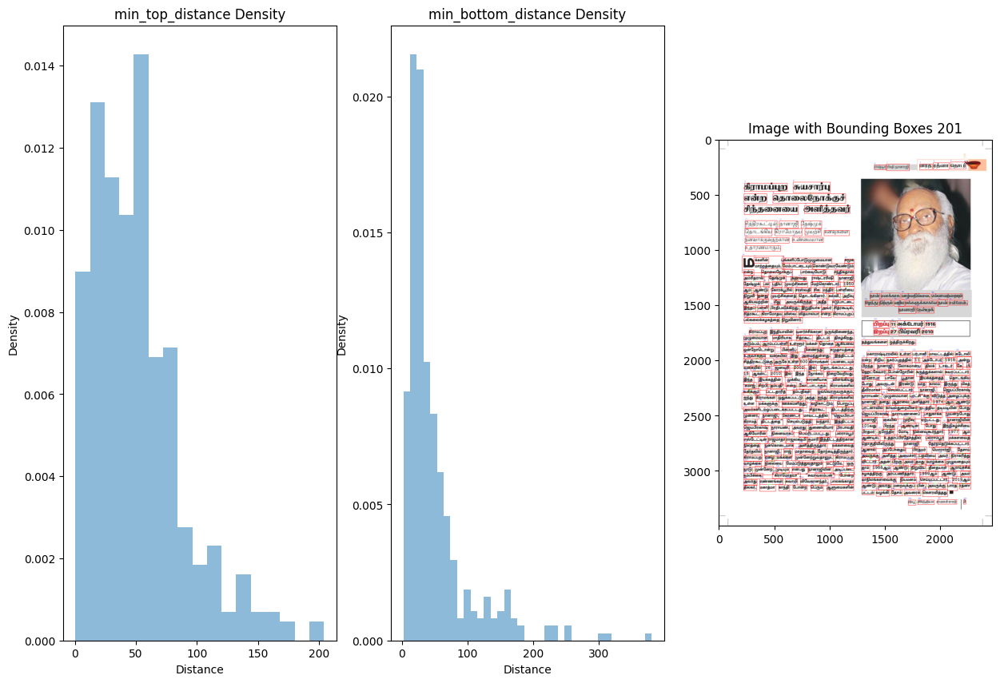

Image_ID : 201
Kernel : gaussian
Bandwidth : 1

Thresholds :-
Top : 37.180359146080406
Bottom : 33.31717889253783
Left : 24.054403188080546
Right : 23.61286064364587


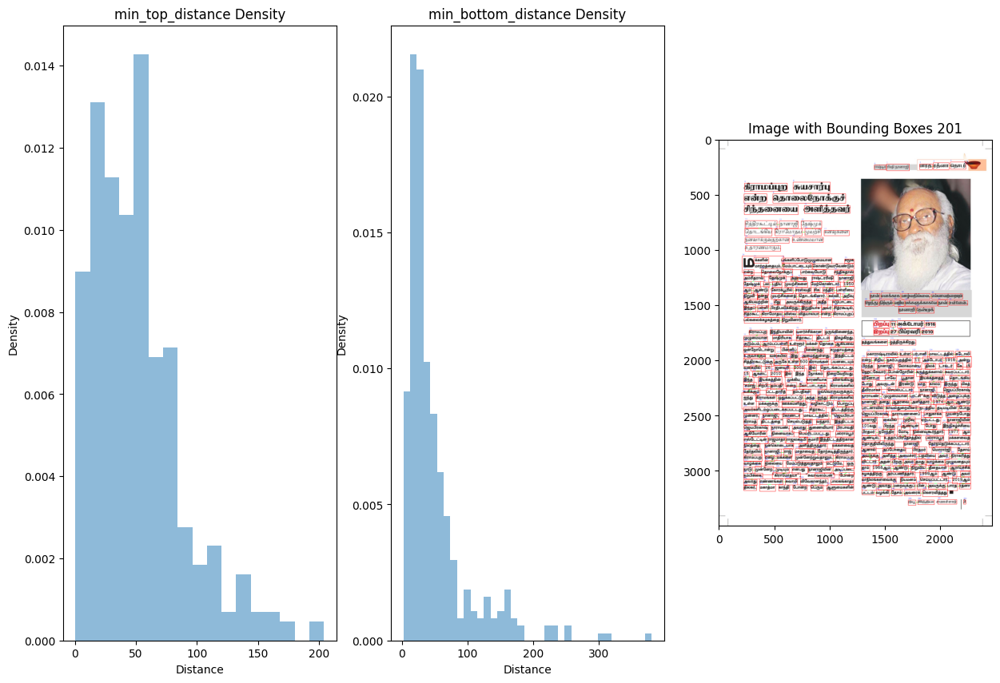

Image_ID : 201
Kernel : gaussian
Bandwidth : 2

Thresholds :-
Top : 38.81122499455197
Bottom : 36.65704917868983
Left : 23.620376202052697
Right : 23.620376202052697


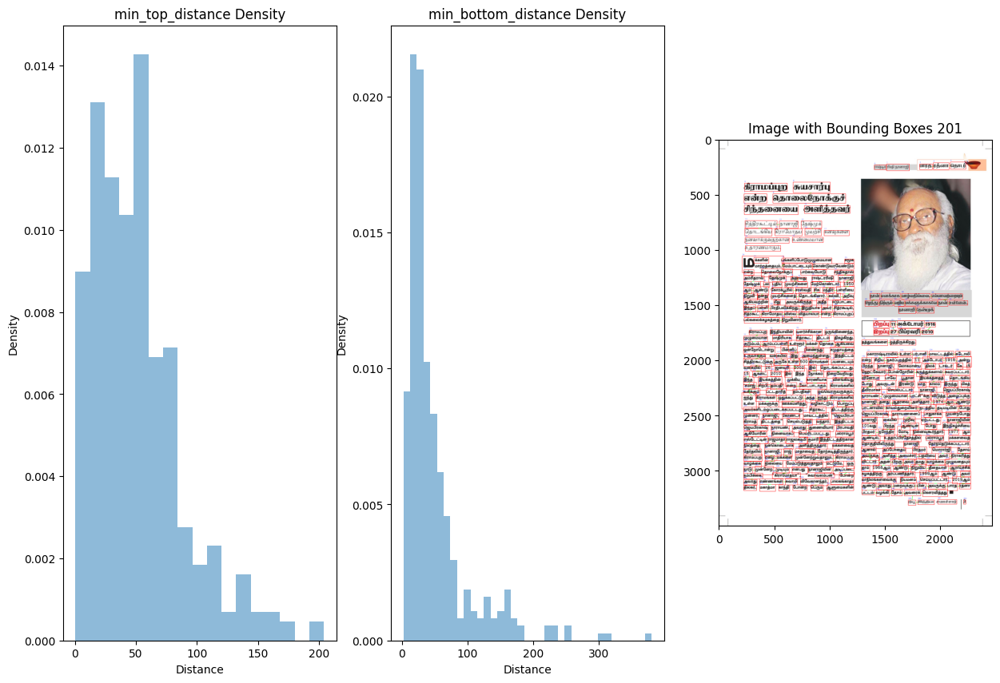

Image_ID : 201
Kernel : gaussian
Bandwidth : 3

Thresholds :-
Top : 37.683663450762374
Bottom : 36.079588687429904
Left : 23.620376202052697
Right : 23.56126957444175


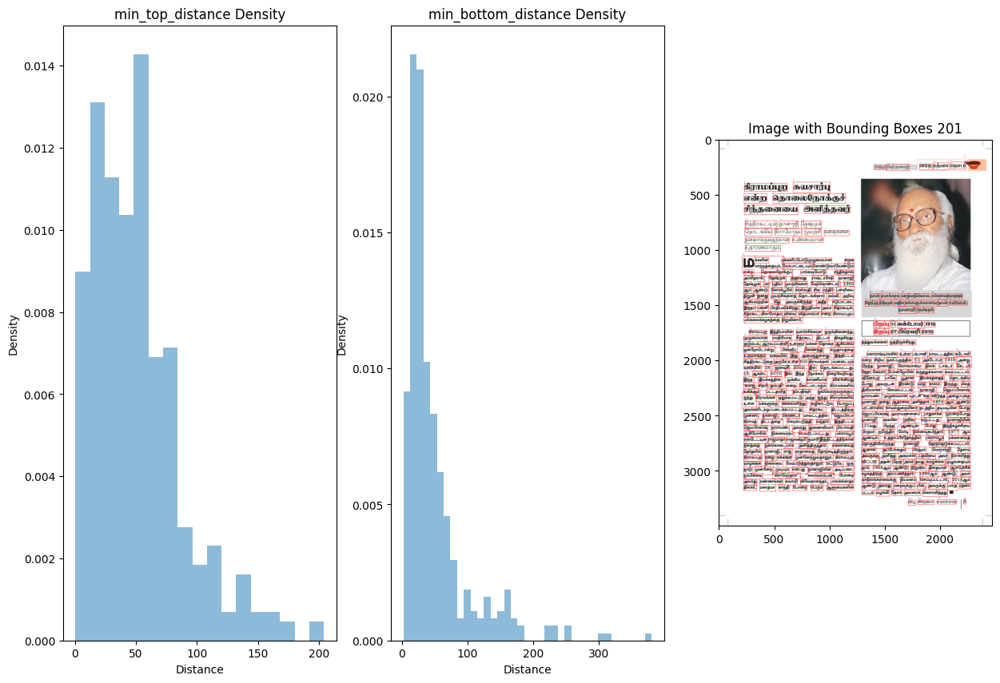

Image_ID : 201
Kernel : gaussian
Bandwidth : 4

Thresholds :-
Top : 37.221757960935626
Bottom : 35.70626866428068
Left : 23.561269574441745
Right : 23.437046446757666


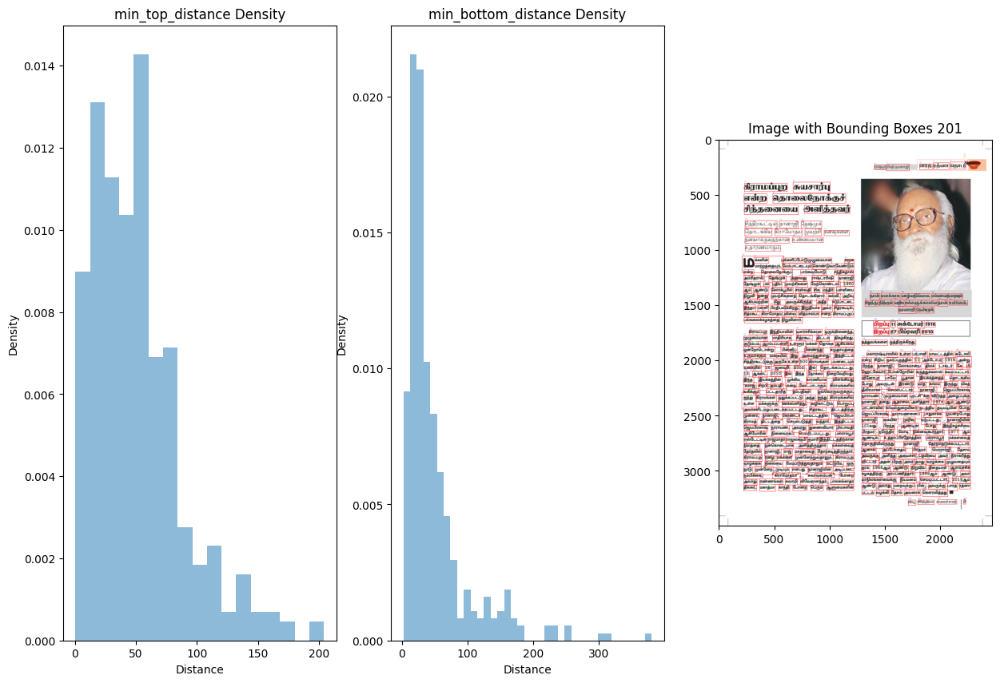

Image_ID : 201
Kernel : triangular
Bandwidth : 1

Thresholds :-
Top : 36.007363731971886
Bottom : 33.748378906533844
Left : 24.948196416741098
Right : 25.523598612517368


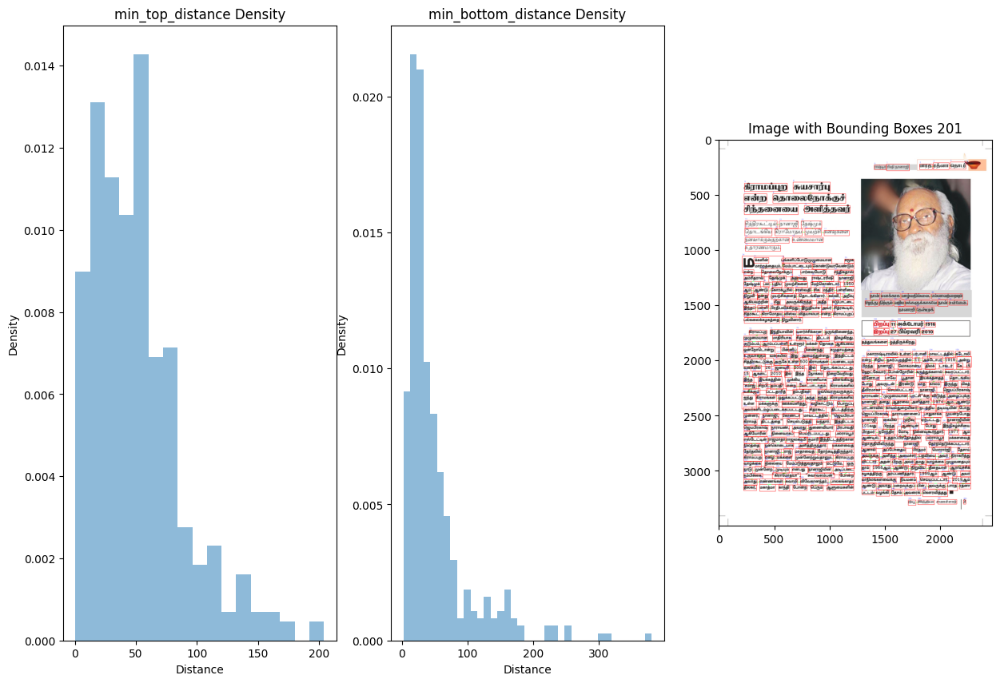

Image_ID : 201
Kernel : triangular
Bandwidth : 2

Thresholds :-
Top : 36.10807360664699
Bottom : 32.64800078160978
Left : 24.054403188080546
Right : 23.483802935773653


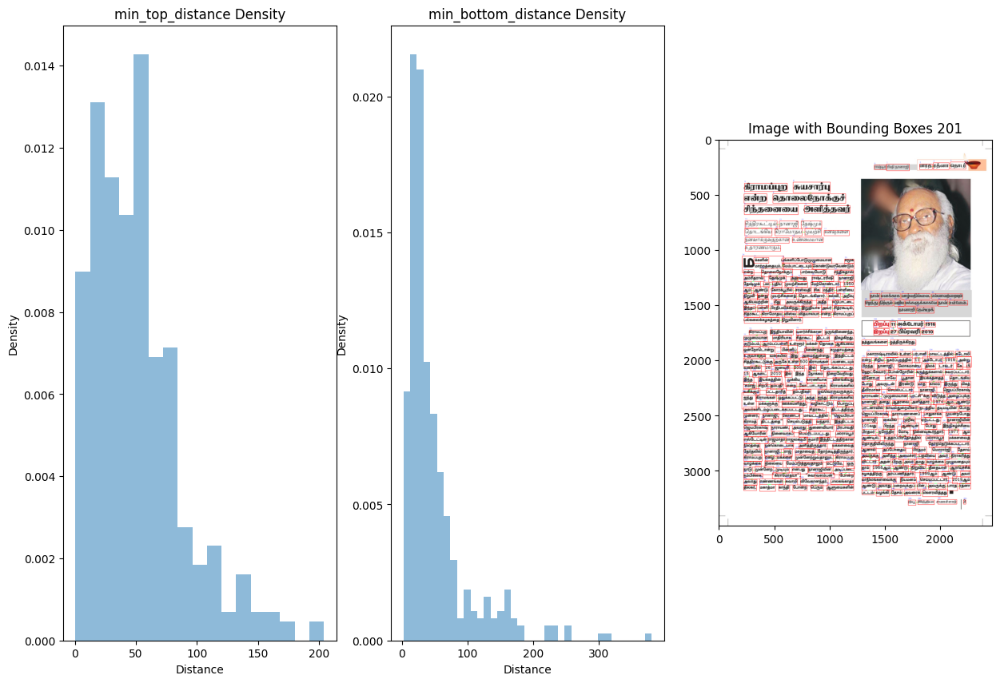

Image_ID : 201
Kernel : triangular
Bandwidth : 3

Thresholds :-
Top : 39.07060601858658
Bottom : 34.235774242237866
Left : 23.86925297699789
Right : 23.620376202052697


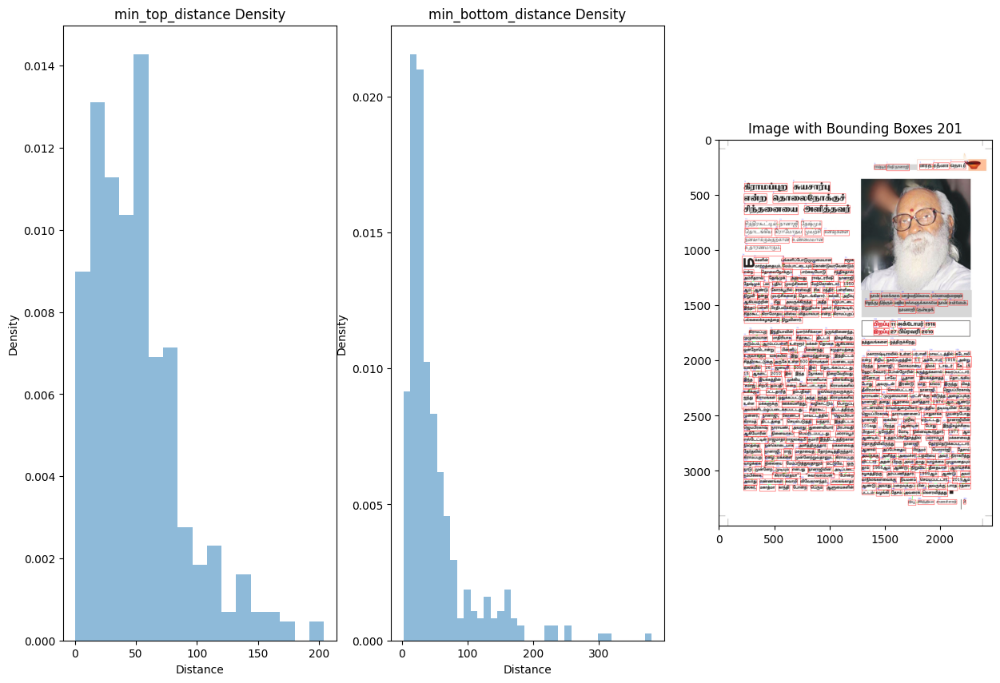

Image_ID : 201
Kernel : triangular
Bandwidth : 4

Thresholds :-
Top : 38.90710505374365
Bottom : 35.55235465628312
Left : 23.620376202052697
Right : 23.620376202052697


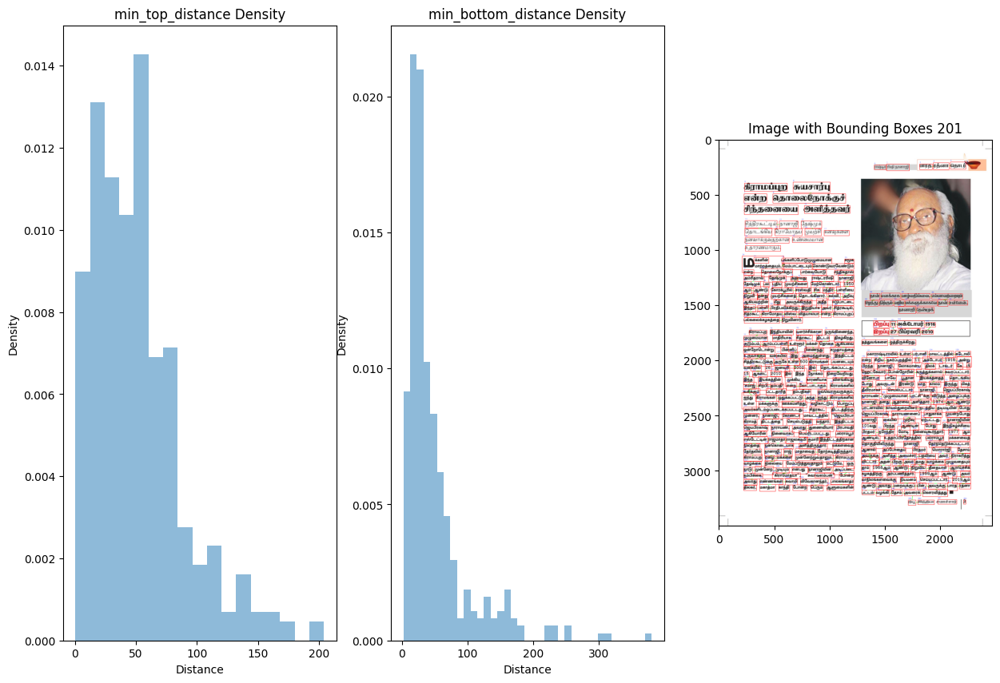

In [265]:
image_ids=["101","152","159","201"]
kernels=["box","gaussian","triangular"]
bandwidths=[1,2,3,4]
for image_id in image_ids:
    for kernel in kernels:
        for bandwidth in [1, 2, 3, 4]:
            print('Image_ID :',image_id)
            print('Kernel :',kernel)
            print('Bandwidth :',bandwidth)
            print()
            visualize_bboxes(image_id, bandwidth=bandwidth,kernel=kernel)
